                                      # DS 5230 Homework 4 and 5 #
                                           **KAVANA VENKATESH**

In [82]:
# Load the required packages 
from sklearn.cluster import KMeans
import pandas as pd
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score 
from sklearn import metrics
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import AgglomerativeClustering 
from sklearn.preprocessing import StandardScaler, normalize 
import scipy.cluster.hierarchy as shc

In [4]:
# Read the images and print their description.
bird = Image.open("C:\\Users\\kava2\\Documents\\Spring2020\\H4+H5\\H4+H5\\42049_colorBird.jpg")
plane=Image.open("C:\\Users\\kava2\\Documents\\Spring2020\\H4+H5\H4+H5\\3096_colorPlane.jpg")
print("Bird format:", bird.format)
print("Bird mode:",bird.mode)
print("Bird image size:", bird.size)
print("Plane format:", plane.format)
print("Plane mode:",plane.mode)
print("Plane image size:", plane.size)

Bird format: JPEG
Bird mode: RGB
Bird image size: (481, 321)
Plane format: JPEG
Plane mode: RGB
Plane image size: (481, 321)


<Figure size 432x288 with 0 Axes>

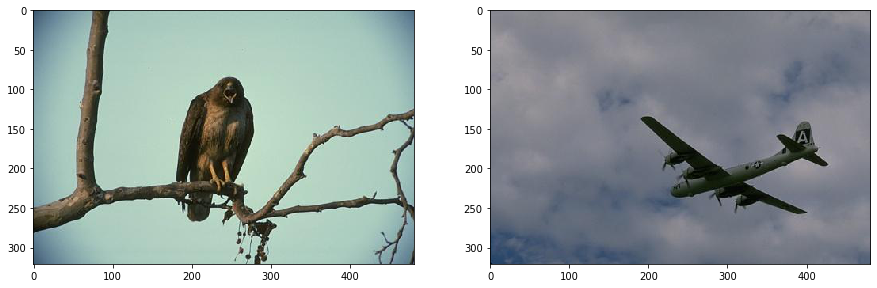

In [5]:
# Display the images
plt.figure()
f, ax = plt.subplots(1,2, figsize=(15,25))
ax[0].imshow(bird)
ax[1].imshow(plane)

In [6]:
#Get the pixel values of colorBird image and put them in an np array
birdPixels = bird.convert("RGB")
birdArray = np.array(birdPixels.getdata()).reshape(bird.size + (3,))
indicesArrayB = np.moveaxis(np.indices(bird.size), 0, 2)
allArrayB = np.dstack((indicesArrayB, birdArray)).reshape((-1, 5))

#Get the pixel values of colorPlane image and put them in an np array
planePixels = plane.convert("RGB")
planeArray = np.array(planePixels.getdata()).reshape(plane.size + (3,))
indicesArrayP = np.moveaxis(np.indices(plane.size), 0, 2)
allArrayP = np.dstack((indicesArrayP, planeArray)).reshape((-1, 5))

# Get the y and x coordinates and the color values of pixels into a dataframe.
df_bird = pd.DataFrame(allArrayB, columns=["y", "x", "red","green","blue"])
df_plane=pd.DataFrame(allArrayP, columns=["y","x", "red","green","blue"])

# Get the minimum and maximum pixel values of Bird
print('Data Type: %s' % birdArray.dtype)
print('Min: %.3f, Max: %.3f' % (birdArray.min(), birdArray.max()))
print('\n')
print(df_bird)

# Get the minimum and maximum pixel values of Plane
print('\n')
print('Data Type: %s' % planeArray.dtype)
print('Min: %.3f, Max: %.3f' % (planeArray.min(), planeArray.max()))
print('\n')
print(df_plane)

# Normalize pixel values and x and y coordinates.
from sklearn.preprocessing import MinMaxScaler

bird_fit= MinMaxScaler()
bird_fit.fit(df_bird)
bird_norm= bird_fit.fit_transform(df_bird)

plane_fit= MinMaxScaler()
plane_fit.fit(df_plane)
plane_norm= plane_fit.fit_transform(df_plane)

print('\n')
print("The normalized dataframe of colorBird image is: \n\n" ,bird_norm)
print('\n')
print("The normalized dataframe of colorPlane is: \n\n" ,plane_norm)

Data Type: int32
Min: 0.000, Max: 252.000


          y    x  red  green  blue
0         0    0   59     87   111
1         0    1   60     88   112
2         0    2   61     89   113
3         0    3   63     91   115
4         0    4   65     93   117
...     ...  ...  ...    ...   ...
154396  480  316   44     54    55
154397  480  317   45     50    54
154398  480  318   27     27    35
154399  480  319   29     27    38
154400  480  320   88    102   128

[154401 rows x 5 columns]


Data Type: int32
Min: 0.000, Max: 184.000


          y    x  red  green  blue
0         0    0  138    138   148
1         0    1  138    138   148
2         0    2  138    138   148
3         0    3  137    137   147
4         0    4  137    137   147
...     ...  ...  ...    ...   ...
154396  480  316   85     98   115
154397  480  317   86     99   116
154398  480  318   84     97   114
154399  480  319   80     93   110
154400  480  320   54     64    74

[154401 rows x 5 columns]


The normalized

1) PCA Solution

In [7]:
# Apply PCA to both the images
from sklearn.decomposition import PCA
pca= PCA(n_components=5)
pca1=pca.fit(bird_norm)
pca2=pca.fit(plane_norm)

# Put the Principal components in a dataframe
columns = ['pca_%i' % i for i in range(5)]
df_pcaB = pd.DataFrame(pca.transform(bird_norm), columns=columns, index=df_bird.index)
print("The normalized colorBird feature dataframe is: \n\n",df_pcaB.head())
print('\n')

columns = ['pca_%i' % i for i in range(5)]
df_pcaP = pd.DataFrame(pca.transform(plane_norm), columns=columns, index=df_plane.index)
print("The normalized colorPlane feature dataframe is: \n\n", df_pcaP.head())


The normalized colorBird feature dataframe is: 

       pca_0     pca_1     pca_2     pca_3     pca_4
0 -0.109166  0.494882  0.734663  0.114736 -0.007879
1 -0.113026  0.491762  0.728861  0.114449 -0.008128
2 -0.116886  0.488643  0.723059  0.114161 -0.008377
3 -0.124630  0.485529  0.711476  0.113569 -0.008878
4 -0.132375  0.482415  0.699892  0.112977 -0.009379


The normalized colorPlane feature dataframe is: 

       pca_0     pca_1     pca_2     pca_3     pca_4
0 -0.529855  0.495038  0.117202  0.003859  0.001352
1 -0.529830  0.491914  0.117182  0.003875  0.001354
2 -0.529805  0.488789  0.117161  0.003891  0.001356
3 -0.524487  0.485656  0.125036  0.004150  0.001795
4 -0.524462  0.482531  0.125015  0.004166  0.001798


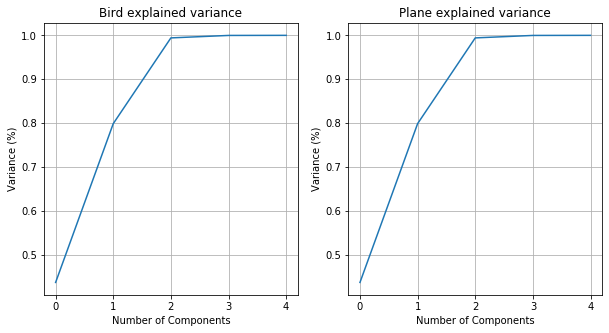

In [14]:
# Plot the screeplot of Bird and Plane
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

ig,(ax1,ax2) = plt.subplots(nrows = 1, ncols = 2, figsize = (10, 5))
ax1.plot(np.cumsum(pca1.explained_variance_ratio_))
ax2.plot(np.cumsum(pca2.explained_variance_ratio_))

ax1.set_xlabel("Number of Components")
ax1.set_ylabel("Variance (%)")

ax2.set_xlabel("Number of Components")
ax2.set_ylabel("Variance (%)")

ax1.title.set_text("Bird explained variance")
ax2.title.set_text("Plane explained variance")

ax1.grid()
ax2.grid()
plt.show()

From the above scree plots, we can see that 3 Principal components of Bird and Plane account for almost all the variance in the data. Hence, the minimum number of dimensions I choose is, D=3.

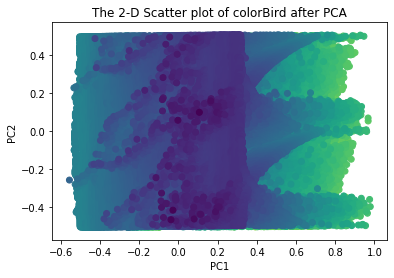

C:\Users\kava2\Anaconda3\lib\site-packages\matplotlib\collections.py:857: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


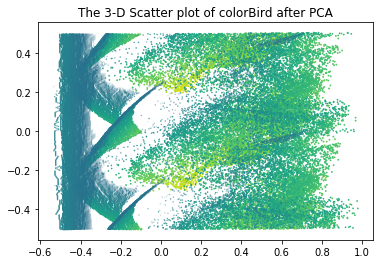

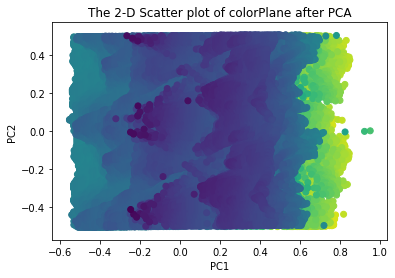

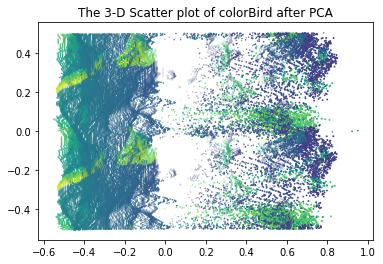

In [59]:
# Plot the 3-D scatter plot of the 3 Principal components
import matplotlib.pyplot as plt

# 2-D Scatter plot of bird with color as an additional attribute
plt.scatter(df_pcaB['pca_0'], df_pcaB['pca_1'], c=df_pcaB['pca_2'], )
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("The 2-D Scatter plot of colorBird after PCA")
plt.show()

# 3-D Scatter plot of colorBird with color as an additional attribute to represent shape of high density regions
plt.scatter(df_pcaB['pca_0'], df_pcaB['pca_1'], df_pcaB['pca_2'], c=df_pcaB['pca_2'], )
plt.title("The 3-D Scatter plot of colorBird after PCA")
plt.show()

#The 2-D Scatter plot of colorPlane after PCA
plt.scatter(df_pcaP['pca_0'], df_pcaP['pca_1'], c=df_pcaP['pca_2'])
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("The 2-D Scatter plot of colorPlane after PCA")
plt.show()

# 3-D Scatter plot of colorPlane with color as an additional attribute to represent shape of high density regions 
plt.scatter(df_pcaP['pca_0'], df_pcaP['pca_1'], df_pcaP['pca_2'], c=df_pcaB['pca_2'], )
plt.title("The 3-D Scatter plot of colorBird after PCA")
plt.show()

2) t-sne Solution

           X          Y
0   2.327713  18.186348
1 -80.474220  -5.166140
2  39.563290  -9.321357
3 -54.387856 -43.364857
4   4.733309 -21.615669
           X          Y
0   5.166876 -22.491385
1  28.635895 -28.734354
2  67.505104  29.313282
3 -39.592808  20.542578
4  61.207233 -36.238682


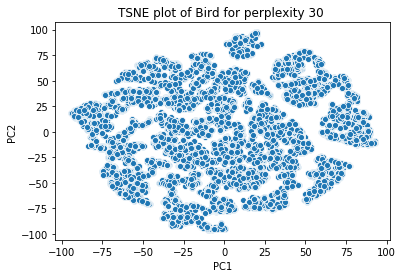

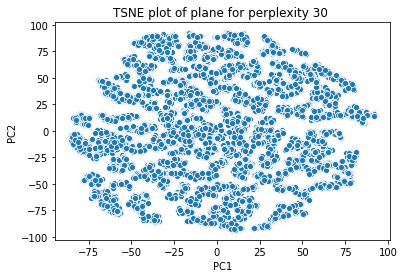

In [60]:
# t-sne for perplexity value=30
from sklearn.manifold import TSNE
import seaborn as sns
import pandas as pd

tsne30= TSNE(n_components=2, perplexity=30)

# Creating samples as t-sne has very long running time
bird_sample= pd.DataFrame(bird_norm).sample(frac=0.1)
plane_sample= pd.DataFrame(plane_norm).sample(frac=0.1)

# fitting t-sne to the data
tsne_fitB30=tsne30.fit_transform(bird_sample)
tsne_fitP30=tsne30.fit_transform(plane_sample)

# Create dataframes containing Principal components after t-sne
tsne_dfB30 = pd.DataFrame({'X':tsne_fitB30[:,0],
                        'Y':tsne_fitB30[:,1]})
tsne_dfP30= pd.DataFrame({'X':tsne_fitP30[:,0],
                         'Y':tsne_fitP30[:,1]})

print(tsne_dfB30.head())
print(tsne_dfP30.head())

# Plot the data of Bird after t-sne
sns.scatterplot(x='X', y='Y', data=tsne_dfB30)
plt.title("TSNE plot of Bird for perplexity 30 ")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.show()

# Plot the data of Plane after t-sne
sns.scatterplot(x='X', y='Y', data=tsne_dfP30)
plt.title("TSNE plot of plane for perplexity 30 ")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.show()

I feel perplexity values of 50 and 70 might be suitable for the given two images. I shall apply t-sne with these values 
to the two given images.

           X          Y
0 -67.239319 -24.483288
1 -19.331800   9.287660
2 -62.434681 -31.810789
3 -32.798080   7.578095
4  25.671604 -24.948511


           X          Y
0  -3.673133 -61.116142
1 -45.072372  28.509676
2 -24.537859 -47.596375
3 -30.162600  58.920746
4  17.906511 -68.552200


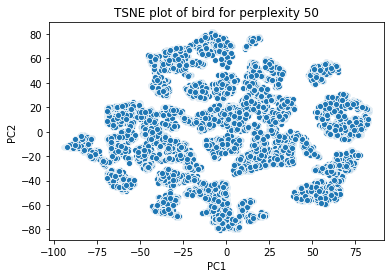

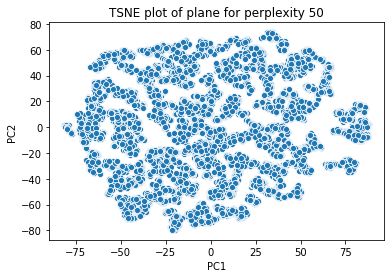

In [61]:
# tsne for perplexity value=50
from sklearn.manifold import TSNE
import seaborn as sns

tsne50= TSNE(n_components=2, perplexity=50)

# Creating samples as t-sne has very long running time
bird_sample= pd.DataFrame(bird_norm).sample(frac=0.1)
plane_sample= pd.DataFrame(plane_norm).sample(frac=0.1)

# fitting t-sne to the data
tsne_fitB50=tsne50.fit_transform(bird_sample)
tsne_fitP50=tsne50.fit_transform(plane_sample)

# Create dataframes containing Principal components after t-sne
tsne_dfB50 = pd.DataFrame({'X':tsne_fitB50[:,0],
                        'Y':tsne_fitB50[:,1]})
tsne_dfP50= pd.DataFrame({'X':tsne_fitP50[:,0],
                         'Y':tsne_fitP50[:,1]})

print(tsne_dfB50.head())
print('\n')
print(tsne_dfP50.head())

# Plot the data of Bird after t-sne
sns.scatterplot(x='X', y='Y', data=tsne_dfB50)
plt.title("TSNE plot of bird for perplexity 50")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.show()

# Plot the data of Plane after t-sne
sns.scatterplot(x='X', y='Y', data=tsne_dfP50)
plt.title("TSNE plot of plane for perplexity 50")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.show()

           X          Y
0  41.844479  -5.760808
1 -29.286114 -15.988814
2   1.408760 -16.099073
3 -78.324326   2.293308
4 -47.694092 -10.534587
           X          Y
0  36.448727 -25.172056
1  19.917572  26.413414
2 -38.382347  35.767921
3   3.216882  40.613895
4  38.177338 -39.547081


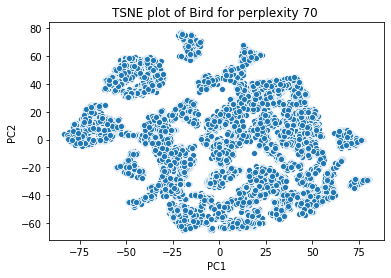

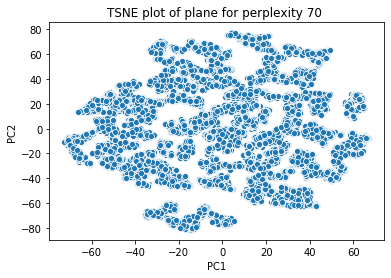

In [62]:
# t-sne for perplexity value=70
from sklearn.manifold import TSNE
import seaborn as sns

tsne70= TSNE(n_components=2, perplexity=70)

# Creating samples as t-sne has very long running time
bird_sample= pd.DataFrame(bird_norm).sample(frac=0.1)
plane_sample= pd.DataFrame(plane_norm).sample(frac=0.1)

# fitting t-sne to the data
tsne_fitB70=tsne70.fit_transform(bird_sample)
tsne_fitP70=tsne70.fit_transform(plane_sample)

# Create dataframes containing Principal components after t-sne
tsne_dfB70 = pd.DataFrame({'X':tsne_fitB70[:,0],
                        'Y':tsne_fitB70[:,1]})
tsne_dfP70= pd.DataFrame({'X':tsne_fitP70[:,0],
                         'Y':tsne_fitP70[:,1]})

print(tsne_dfB70.head())
print(tsne_dfP70.head())

# Plot the data of Bird after t-sne
sns.scatterplot(x='X', y='Y', data=tsne_dfB70)
plt.title("TSNE plot of Bird for perplexity 70 ")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.show()

# Plot the data of Plane after t-sne
sns.scatterplot(x='X', y='Y', data=tsne_dfP70)
plt.title("TSNE plot of plane for perplexity 70 ")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.show()

We can notice from the above graphs that as the perplexity values increase, the clusters become more distinct and are held far apart. 

                                                # Homework 5
                                                

3) K-means Clustering Solution

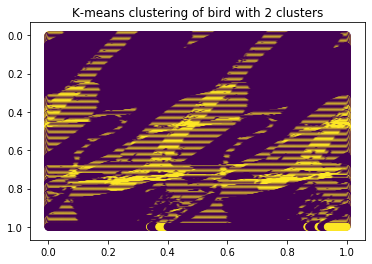

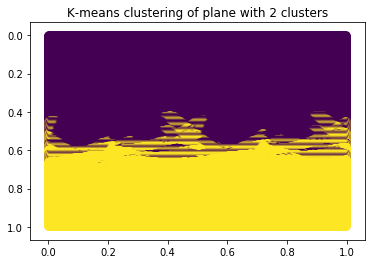

In [137]:
# K-means
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

kmeans=KMeans(2, random_state=0)

# Fitting with inputs
labelsB= kmeans.fit_predict(bird_norm)
labelsP= kmeans.fit_predict(plane_norm)

# Plot k-means of bird and plane with clusters=2
plt.scatter(bird_norm[:,1], bird_norm[:,0], c=labelsB, s=50)
plt.gca().invert_yaxis()
plt.title("K-means clustering of bird with 2 clusters")
plt.show()

plt.scatter(plane_norm[:,1], plane_norm[:,0], c=labelsP, s=50)
plt.gca().invert_yaxis()
plt.title("K-means clustering of plane with 2 clusters")
plt.show()

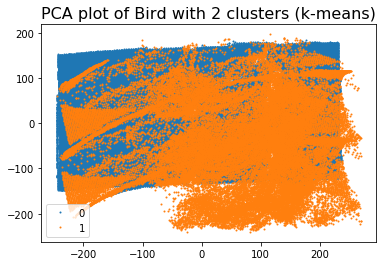

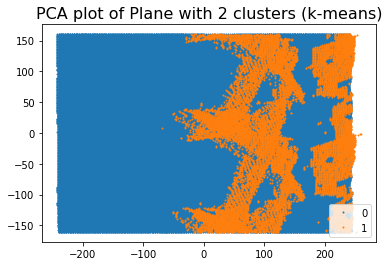

In [63]:
# Returning  to the PCA plots to display the clustering solutions for above  scatter plots.
pca = PCA(n_components=3).fit_transform(df_bird)
df_bird['pca1'] = pca[:,0]
df_bird['pca2'] = pca[:,1]*-1
df_bird['pca3'] = pca[:,2]
df_bird['k-means2'] = labelsB
groups = df_bird.groupby('k-means2')

# Plot the Bird data to show clusters after PCA
fig, ax = plt.subplots()
ax.margins(0.05) # Optional, just adds 5% padding to the autoscaling
for name, group in groups:
    ax.plot(group.pca1, group.pca2, marker='o', linestyle='', ms=1, label=name)
ax.legend()
ax.set_title('PCA plot of Bird with 2 clusters (k-means)',fontsize = 16)
plt.show()

# Plot for Plane
pcaP = PCA(n_components=3).fit_transform(df_plane)
df_plane['pca1'] = pcaP[:,0]
df_plane['pca2'] = pcaP[:,1]*-1
df_plane['pca3'] = pcaP[:,2]
df_plane['k-means2'] = labelsP
groups = df_plane.groupby('k-means2')

fig, ax = plt.subplots()
ax.margins(0.05) # Optional, just adds 5% padding to the autoscaling
for name, group in groups:
    ax.plot(group.pca1, group.pca2, marker='o', linestyle='', ms=1, label=name)
ax.legend()
ax.set_title('PCA plot of Plane with 2 clusters (k-means)',fontsize = 16)
plt.show()

In [93]:
# Implementing TSNE 
from sklearn.manifold import TSNE

model = TSNE(n_components = 2,random_state = 0, perplexity=30.0)

# Sample data as t-sne has long running time
bird_sample= df_bird.sample(frac=0.1)
bird_normS= np.asarray(pd.DataFrame(bird_norm).sample(frac=0.1))

t_dataB = model.fit_transform(bird_sample)
bird_sample['tsne1'] = t_dataB[:,0]
bird_sample['tsne2'] = t_dataB[:,1]


# t-sne for Plane
model = TSNE(n_components = 2,random_state = 0, perplexity=30.0)

plane_sample= df_plane.sample(frac=0.1)
plane_normS= np.asarray(pd.DataFrame(plane_norm).sample(frac=0.1))

t_dataP = model.fit_transform(plane_sample)
plane_sample['tsne1'] = t_dataP[:,0]
plane_sample['tsne2'] = t_dataP[:,1]

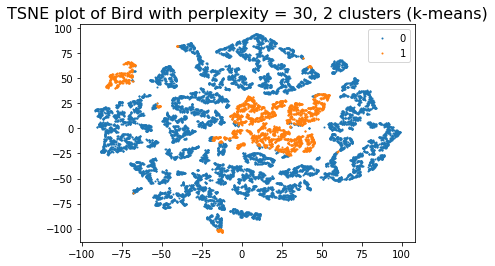

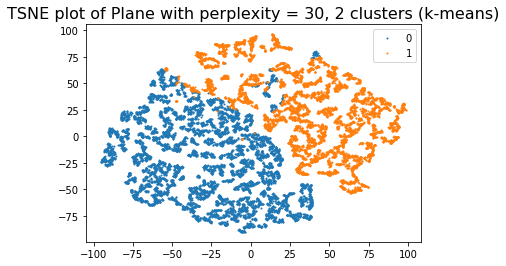

In [81]:
# Returning  to the TSNE plots to display the clustering solutions above  scatter plots.
groups = bird_sample.groupby('k-means2')

fig, ax = plt.subplots()
ax.margins(0.05) # Optional, just adds 5% padding to the autoscaling
for name, group in groups:
    ax.plot(group.tsne1, group.tsne2, marker='o', linestyle='', ms=1, label=name)
ax.legend()
ax.set_title('TSNE plot of Bird with perplexity = 30, 2 clusters (k-means)',fontsize = 16)
plt.show()

# t-sne plot of Plane

groups = plane_sample.groupby('k-means2')

fig, ax = plt.subplots()
ax.margins(0.05) # Optional, just adds 5% padding to the autoscaling
for name, group in groups:
    ax.plot(group.tsne1, group.tsne2, marker='o', linestyle='', ms=1, label=name)
ax.legend()
ax.set_title('TSNE plot of Plane with perplexity = 30, 2 clusters (k-means)',fontsize = 16)
plt.show()

In [64]:
# Silhouette score by euclidean distance for 2 clusters
print("The Silhouette coeeficient for clustering of bird is: \n\n",
      metrics.silhouette_score(bird_norm, labelsB, metric = 'euclidean'))

print("The Silhouette coeeficient for clustering of plane is: \n\n",
      metrics.silhouette_score(plane_norm, labelsP, metric = 'euclidean'))

The Silhouette coeeficient for clustering of bird is: 

 0.31032306697683537
The Silhouette coeeficient for clustering of plane is: 

 0.35150013829323956


In [50]:
# calculating the CH value for 2 clusters
print("The CH value for clustering of bird with 2 clusters is:",metrics.calinski_harabasz_score(bird_norm, labelsB))

print("The CH value for clustering of plane with 2 clusters is:",metrics.calinski_harabasz_score(plane_norm, labelsB))

The CH value for clustering of bird with 2 clusters is: 100079.6532076705


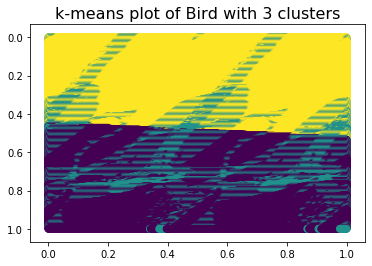

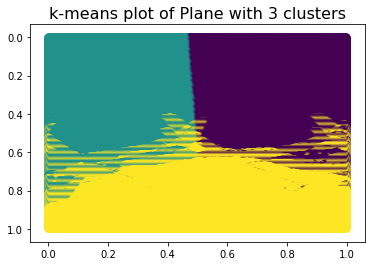

In [51]:
# implementing kmeans with 3 clusters
labelsB3 = KMeans(3, random_state=0).fit_predict(bird_norm)
labelsP3 = KMeans(3, random_state=0).fit_predict(plane_norm)
df_bird['k-means3'] = labelsB3
df_plane['k-means']= labelsP3

# Plotting K-means clustering of bird
plt.scatter(bird_norm[:, 1], bird_norm[:, 0], c=labelsB3,s=50);
plt.gca().invert_yaxis()
plt.title('k-means plot of Bird with 3 clusters',fontsize = 16 )
plt.show()

# Plotting K-means clustering of Plane
plt.scatter(plane_norm[:, 1], plane_norm[:, 0], c=labelsP3,s=50);
plt.gca().invert_yaxis()
plt.title('k-means plot of Plane with 3 clusters',fontsize = 16 )
plt.show()

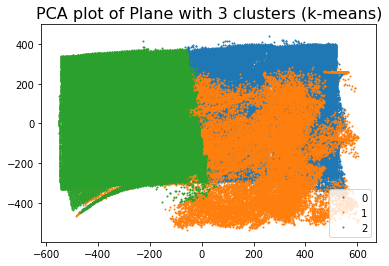

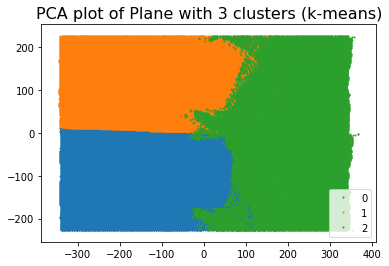

In [66]:
# Returning  to the PCA plots to display the clustering solutions above  scatter plots.
df_bird['k-means3'] = labelsB3

groups = df_bird.groupby('k-means3')

fig, ax = plt.subplots()
ax.margins(0.06) # Optional, just adds 5% padding to the autoscaling
for name, group in groups:
    ax.plot(group.pca1, group.pca2, marker = 'o', linestyle='', ms=1, label=name)
ax.legend()
ax.set_title('PCA plot of Plane with 3 clusters (k-means)',fontsize = 16)
plt.show()


# PCA plots of Plane
df_plane['k-means3'] = labelsP3
groups = df_plane.groupby('k-means3')
fig, ax = plt.subplots()
ax.margins(0.06) # Optional, just adds 5% padding to the autoscaling
for name, group in groups:
    ax.plot(group.pca1, group.pca2, marker = 'o', linestyle='', ms=1, label=name)
ax.legend()
ax.set_title('PCA plot of Plane with 3 clusters (k-means)',fontsize = 16)
plt.show()

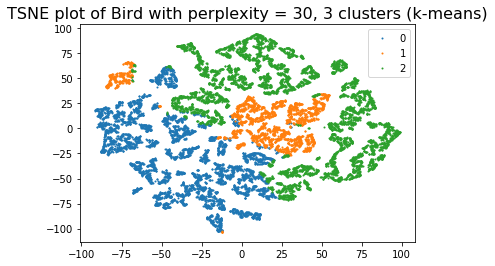

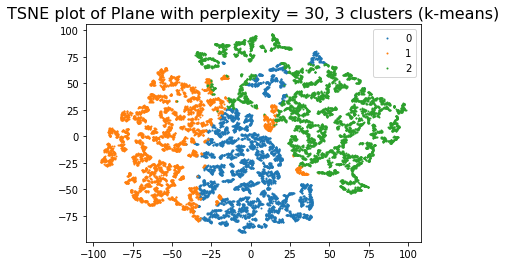

In [82]:
# Returning  to the TSNE plots to display the clustering solutions above  scatter plots.
groups = bird_sample.groupby('k-means3')

fig, ax = plt.subplots()
ax.margins(0.05) # Optional, just adds 5% padding to the autoscaling
for name, group in groups:
    ax.plot(group.tsne1, group.tsne2, marker='o', linestyle='', ms=1, label=name)
ax.legend()
ax.set_title('TSNE plot of Bird with perplexity = 30, 3 clusters (k-means)',fontsize = 16)
plt.show()


# Plots of Plane
groups = plane_sample.groupby('k-means3')

fig, ax = plt.subplots()
ax.margins(0.05) # Optional, just adds 5% padding to the autoscaling
for name, group in groups:
    ax.plot(group.tsne1, group.tsne2, marker='o', linestyle='', ms=1, label=name)
ax.legend()
ax.set_title('TSNE plot of Plane with perplexity = 30, 3 clusters (k-means)',fontsize = 16)
plt.show()

In [65]:
# Silhouette score by euclidean distance for 3 clusters
print("Silhouette Coefficient of Bird with 3 clusters: \n\n",
      metrics.silhouette_score(bird_norm, labelsB3, metric = 'euclidean'))

print("Silhouette Coefficient of Plane with 3 clusters: \n\n",
      metrics.silhouette_score(plane_norm, labelsP3, metric = 'euclidean'))

Silhouette Coefficient of Bird with 3 clusters: 

 0.25286554886995544
Silhouette Coefficient of Plane with 3 clusters: 

 0.2994938764564614


In [66]:
# calculating the CH value for 3 clusters
print("CH value for 3 clusters of image Bird: \n\n",
      metrics.calinski_harabasz_score(bird_norm, labelsB3))

print("CH value for 3 clusters of image Plane: \n\n",
      metrics.calinski_harabasz_score(plane_norm, labelsP3))

CH value for 3 clusters of image Bird: 

 58788.78174901687
CH value for 3 clusters of image Plane: 

 56456.57257129572


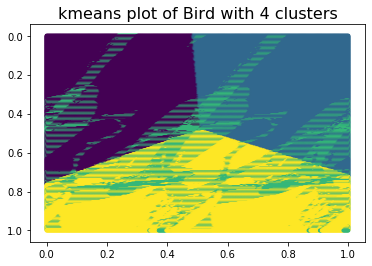

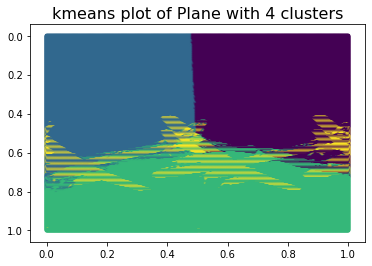

In [58]:
# implementing kmeans with 4 clusters
labelsB4 = KMeans(4, random_state=0).fit_predict(bird_norm)
plt.scatter(bird_norm[:, 1], bird_norm[:, 0], c=labelsB4,s=10);
plt.gca().invert_yaxis()
plt.title('kmeans plot of Bird with 4 clusters',fontsize = 16 )
plt.show()

labelsP4 = KMeans(4, random_state=0).fit_predict(plane_norm)
plt.scatter(plane_norm[:, 1], plane_norm[:, 0], c=labelsP4,s=10);
plt.gca().invert_yaxis()
plt.title('kmeans plot of Plane with 4 clusters',fontsize = 16 )
plt.show()

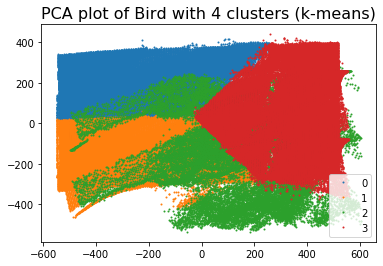

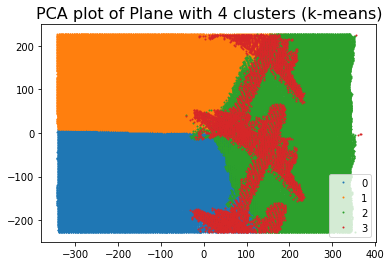

In [65]:
# Returning  to the PCA plots to display the clustering solutions above  scatter plots.
df_bird['k-means4'] = labelsB4
groups = df_bird.groupby('k-means4')

fig, ax = plt.subplots()
ax.margins(0.05) # Optional, just adds 5% padding to the autoscaling
for name, group in groups:
    ax.plot(group.pca1, group.pca2, marker='o', linestyle='', ms=1, label=name)
ax.legend()
ax.set_title('PCA plot of Bird with 4 clusters (k-means)',fontsize = 16)
plt.show()

# Plot for Plane
df_plane['k-means4'] = labelsP4
groups = df_plane.groupby('k-means4')

fig, ax = plt.subplots()
ax.margins(0.05) # Optional, just adds 5% padding to the autoscaling
for name, group in groups:
    ax.plot(group.pca1, group.pca2, marker='o', linestyle='', ms=1, label=name)
ax.legend()
ax.set_title('PCA plot of Plane with 4 clusters (k-means)',fontsize = 16)
plt.show()

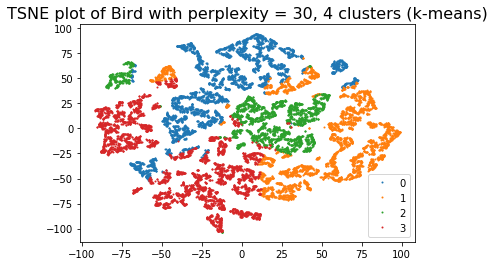

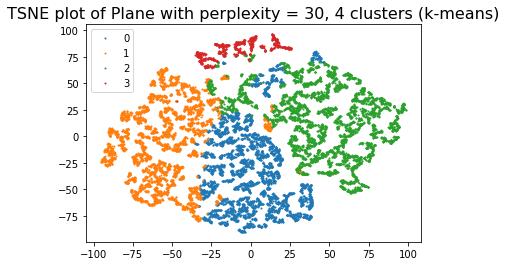

In [86]:
# Returning  to the TSNE plots to display the clustering solutions above  scatter plots.
groups = bird_sample.groupby('k-means4')

fig, ax = plt.subplots()
ax.margins(0.05) # Optional, just adds 5% padding to the autoscaling
for name, group in groups:
    ax.plot(group.tsne1, group.tsne2, marker='o', linestyle='', ms=1, label=name)
ax.legend()
ax.set_title('TSNE plot of Bird with perplexity = 30, 4 clusters (k-means)',fontsize = 16)
plt.show()


# Plots of Plane
groups = plane_sample.groupby('k-means4')

fig, ax = plt.subplots()
ax.margins(0.05) # Optional, just adds 5% padding to the autoscaling
for name, group in groups:
    ax.plot(group.tsne1, group.tsne2, marker='o', linestyle='', ms=1, label=name)
ax.legend()
ax.set_title('TSNE plot of Plane with perplexity = 30, 4 clusters (k-means)',fontsize = 16)
plt.show()

In [67]:
# Silhouette score by euclidean distance for 4 clusters
print("Silhouette coefficient of Bird for 4 clusters:\n\n",
      metrics.silhouette_score(bird_norm, labelsB4, metric = 'euclidean'))

print("Silhouette coefficient of Plane for 4 clusters:\n\n",
      metrics.silhouette_score(plane_norm, labelsP4, metric = 'euclidean'))

Silhouette coefficient of Bird for 4 clusters:

 0.37108356751375204
Silhouette coefficient of Plane for 4 clusters:

 0.36233772321015795


In [68]:
# calculating the CH value for 4 clusters
print("CH value for Bird for 4 clusters: \n\n",
      metrics.calinski_harabasz_score(bird_norm, labelsB4))
print('\n')

print("CH value for Plane for 4 clusters: \n\n",
      metrics.calinski_harabasz_score(plane_norm, labelsP4))

CH value for Bird for 4 clusters: 

 111768.80575545467


CH value for Plane for 4 clusters: 

 92912.53322756178


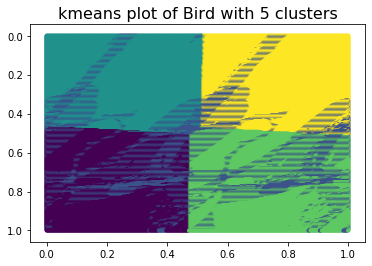

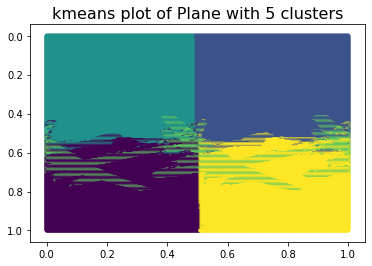

In [71]:
# implementing kmeans with 5 clusters

labelsB5 = KMeans(5, random_state=0).fit_predict(bird_norm)
df_bird['k-means5'] = labelsB5
plt.scatter(bird_norm[:, 1], bird_norm[:, 0], c=labelsB5,s=10);
plt.gca().invert_yaxis()
plt.title('kmeans plot of Bird with 5 clusters',fontsize = 16 )
plt.show()

# K-means of Plane
labelsP5 = KMeans(5, random_state=0).fit_predict(plane_norm)
df_plane['k-means5'] = labelsP5
plt.scatter(plane_norm[:, 1], plane_norm[:, 0], c=labelsP5,s=10);
plt.gca().invert_yaxis()
plt.title('kmeans plot of Plane with 5 clusters',fontsize = 16 )
plt.show()

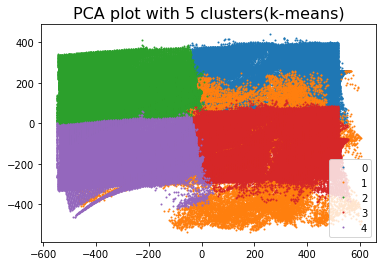

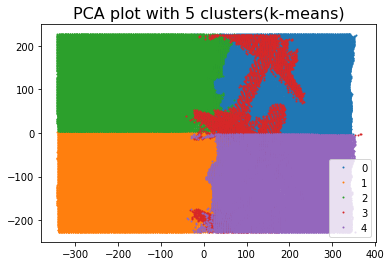

In [72]:
# Returning  to the PCA plots to display the clustering solutions above  scatter plots.
df_bird['k-means5'] = labelsB5
groups = df_bird.groupby('k-means5')

fig, ax = plt.subplots()
ax.margins(0.05) # Optional, just adds 5% padding to the autoscaling
for name, group in groups:
    ax.plot(group.pca1, group.pca2, marker='o', linestyle='', ms=1, label=name)
ax.legend()
ax.set_title('PCA plot with 5 clusters(k-means)',fontsize = 16)
plt.show()


# PCA plots of Plane
df_plane['k-means5'] = labelsP5
groups = df_plane.groupby('k-means5')
fig, ax = plt.subplots()
ax.margins(0.05) # Optional, just adds 5% padding to the autoscaling
for name, group in groups:
    ax.plot(group.pca1, group.pca2, marker='o', linestyle='', ms=1, label=name)
ax.legend()
ax.set_title('PCA plot with 5 clusters(k-means)',fontsize = 16)
plt.show()

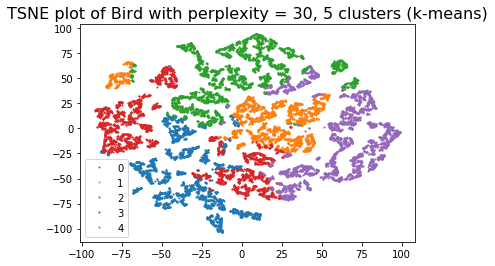

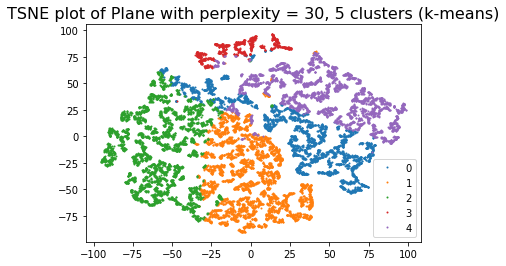

In [87]:
# Returning  to the TSNE plots to display the clustering solutions above  scatter plots.
groups = bird_sample.groupby('k-means5')

fig, ax = plt.subplots()
ax.margins(0.05) # Optional, just adds 5% padding to the autoscaling
for name, group in groups:
    ax.plot(group.tsne1, group.tsne2, marker='o', linestyle='', ms=1, label=name)
ax.legend()
ax.set_title('TSNE plot of Bird with perplexity = 30, 5 clusters (k-means)',fontsize = 16)
plt.show()

# Plot of Plane

groups = plane_sample.groupby('k-means5')
fig, ax = plt.subplots()
ax.margins(0.05) # Optional, just adds 5% padding to the autoscaling
for name, group in groups:
    ax.plot(group.tsne1, group.tsne2, marker='o', linestyle='', ms=1, label=name)
ax.legend()
ax.set_title('TSNE plot of Plane with perplexity = 30, 5 clusters (k-means)',fontsize = 16)
plt.show()

In [74]:
# Silhouette score by euclidean distance for 5 clusters
print("Silhouette coefficient of Bird for 5 clusters:\n\n",
      metrics.silhouette_score(bird_norm, labelsB5, metric = 'euclidean'))

print('\n')

print("Silhouette coefficient of Plane for 5 clusters:\n\n",
      metrics.silhouette_score(plane_norm, labelsP5, metric = 'euclidean'))

Silhouette coefficient of Bird for 5 clusters:

 0.3793396605017465


Silhouette coefficient of Plane for 5 clusters:

 0.3706009307980829


In [88]:
# calculating the CH value for 5 clusters
print("CH value of Bird for 5 clusters: \n\n", 
      metrics.calinski_harabasz_score(bird_norm, labelsB5))

print("CH value of Plane for 5 clusters: \n\n",
      metrics.calinski_harabasz_score(plane_norm, labelsP5))

CH value of Bird for 5 clusters: 

 115479.83015612024
CH value of Plane for 5 clusters: 

 109592.45186610441


Among all clusters, for K-means, both bird and plane have highest Silhouette Coefficient for 5 clusters.

4) GMM Solution

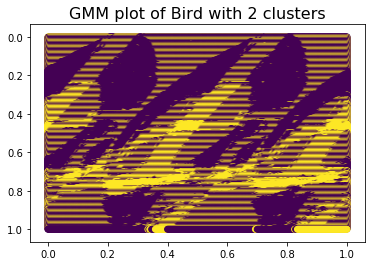

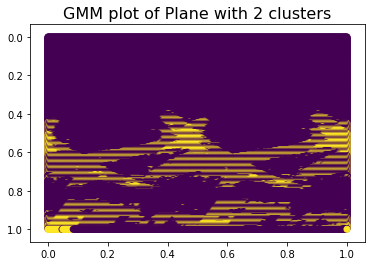

In [67]:
# implementing GMM with 2 clusters
gmmB = GaussianMixture(n_components=2).fit(bird_norm)
gmmP = GaussianMixture(n_components=2).fit(plane_norm)

labelsB = gmmB.predict(bird_norm)
df_bird['gmm-2'] = labelsB
plt.scatter(bird_norm[:, 1], bird_norm[:, 0], c=labelsB);
plt.gca().invert_yaxis()
plt.title('GMM plot of Bird with 2 clusters',fontsize = 16 )
plt.show()

labelsP = gmmP.predict(plane_norm)
df_plane['gmm-2'] = labelsP
plt.scatter(plane_norm[:, 1], plane_norm[:, 0], c=labelsP);
plt.gca().invert_yaxis()
plt.title('GMM plot of Plane with 2 clusters',fontsize = 16 )
plt.show()

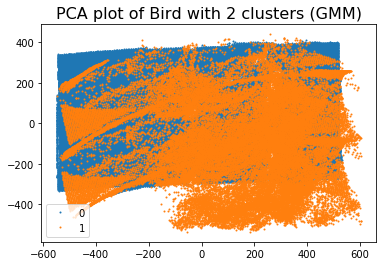

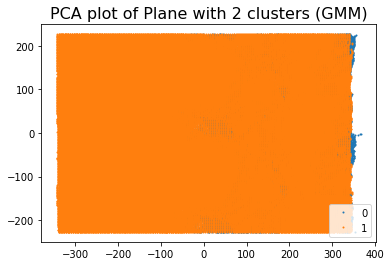

In [91]:
# Returning  to the PCA plots to display the clustering solutions above  scatter plots.
groups = df_bird.groupby('gmm-2')

fig, ax = plt.subplots()
ax.margins(0.05)
for name, group in groups:
    ax.plot(group.pca1, group.pca2, marker='o', linestyle='', ms=1, label=name)
ax.legend()
ax.set_title('PCA plot of Bird with 2 clusters (GMM)',fontsize = 16)
plt.show()


# Plots of Plane
groups = df_plane.groupby('gmm-2')

fig, ax = plt.subplots()
ax.margins(0.05)
for name, group in groups:
    ax.plot(group.pca1, group.pca2, marker='o', linestyle='', ms=1, label=name)
ax.legend()
ax.set_title('PCA plot of Plane with 2 clusters (GMM)',fontsize = 16)
plt.show()

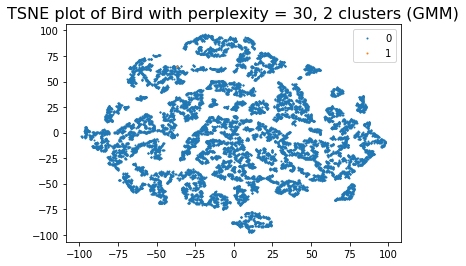

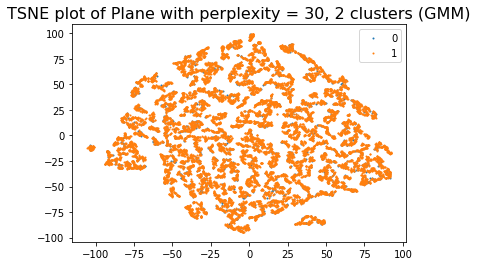

In [23]:
# Returning  to the TSNE plots to display the clustering solutions above  scatter plots.
groups =bird_sample.groupby('gmm-2')

fig, ax = plt.subplots()
ax.margins(0.05) # Optional, just adds 5% padding to the autoscaling
for name, group in groups:
    ax.plot(group.tsne1, group.tsne2, marker='o', linestyle='', ms=1, label=name)
ax.legend()
ax.set_title('TSNE plot of Bird with perplexity = 30, 2 clusters (GMM)',fontsize = 16)
plt.show()


# Plot of Plane
groups = plane_sample.groupby('gmm-2')

fig, ax = plt.subplots()
ax.margins(0.05) # Optional, just adds 5% padding to the autoscaling
for name, group in groups:
    ax.plot(group.tsne1, group.tsne2, marker='o', linestyle='', ms=1, label=name)
ax.legend()
ax.set_title('TSNE plot of Plane with perplexity = 30, 2 clusters (GMM)',fontsize = 16)
plt.show()

In [68]:
# Silhouette score for GMM with 2 clusters
print("Silhouette coefficient of Bird for 5 clusters:\n\n",
      metrics.silhouette_score(bird_norm, labelsB))

print('\n')

print("Silhouette coefficient of Plane for 5 clusters:\n\n",
      metrics.silhouette_score(plane_norm, labelsP))

Silhouette coefficient of Bird for 5 clusters:

 0.31032306697683537


Silhouette coefficient of Plane for 5 clusters:

 0.35410562175857196


In [69]:
# calculating the CH value for 2 clusters
print("CH value of Bird for 2 clusters: \n\n", 
      metrics.calinski_harabasz_score(bird_norm, labelsB))

print("CH value of Plane for 2 clusters: \n\n",
      metrics.calinski_harabasz_score(plane_norm, labelsP))

CH value of Bird for 2 clusters: 

 58024.496565901405
CH value of Plane for 2 clusters: 

 34024.82503182675


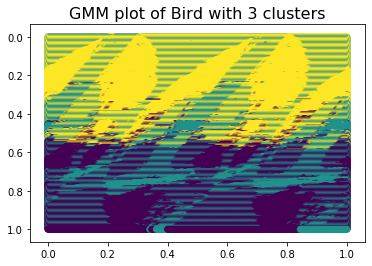

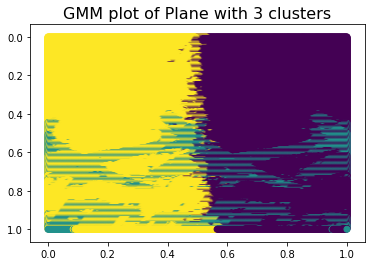

In [70]:
# implementing GMM with 3 clusters
gmmB3 = GaussianMixture(n_components=3).fit(bird_norm)
gmmP3 = GaussianMixture(n_components=3).fit(plane_norm)

labelsB3 = gmmB3.predict(bird_norm)
df_bird['gmm-3'] = labelsB3
plt.scatter(bird_norm[:, 1], bird_norm[:, 0], c=labelsB3);
plt.gca().invert_yaxis()
plt.title('GMM plot of Bird with 3 clusters',fontsize = 16 )
plt.show()

# Plots of Plane
labelsP3 = gmmP3.predict(plane_norm)
df_plane['gmm-3'] = labelsP3
plt.scatter(plane_norm[:, 1], plane_norm[:, 0], c=labelsP3);
plt.gca().invert_yaxis()
plt.title('GMM plot of Plane with 3 clusters',fontsize = 16 )
plt.show()

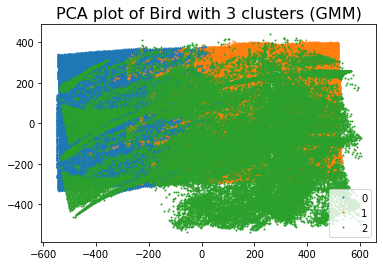

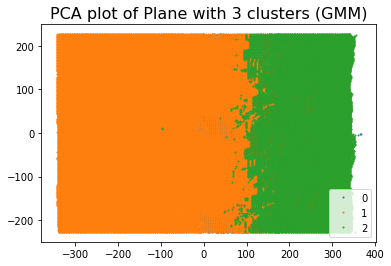

In [95]:
# Returning  to the PCA plots to display the clustering solutions above  scatter plots.
groups = df_bird.groupby('gmm-3')

fig, ax = plt.subplots()
ax.margins(0.05)
for name, group in groups:
    ax.plot(group.pca1, group.pca2, marker='o', linestyle='', ms=1, label=name)
ax.legend()
ax.set_title('PCA plot of Bird with 3 clusters (GMM)',fontsize = 16)
plt.show()


# Plots of Plane
groups = df_plane.groupby('gmm-3')

fig, ax = plt.subplots()
ax.margins(0.05)
for name, group in groups:
    ax.plot(group.pca1, group.pca2, marker='o', linestyle='', ms=1, label=name)
ax.legend()
ax.set_title('PCA plot of Plane with 3 clusters (GMM)',fontsize = 16)
plt.show()

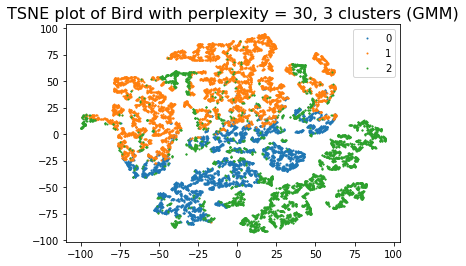

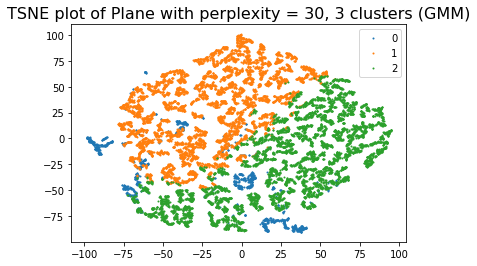

In [36]:
# Returning  to the TSNE plots to display the clustering solutions above  scatter plots.
groups = bird_sample.groupby('gmm-3')

fig, ax = plt.subplots()
ax.margins(0.05) # Optional, just adds 5% padding to the autoscaling
for name, group in groups:
    ax.plot(group.tsne1, group.tsne2, marker='o', linestyle='', ms=1, label=name)
ax.legend()
ax.set_title('TSNE plot of Bird with perplexity = 30, 3 clusters (GMM)',fontsize = 16)
plt.show()


# Plot of Plane
groups = plane_sample.groupby('gmm-3')

fig, ax = plt.subplots()
ax.margins(0.05) # Optional, just adds 5% padding to the autoscaling
for name, group in groups:
    ax.plot(group.tsne1, group.tsne2, marker='o', linestyle='', ms=1, label=name)
ax.legend()
ax.set_title('TSNE plot of Plane with perplexity = 30, 3 clusters (GMM)',fontsize = 16)
plt.show()

In [71]:
# Silhouette score for GMM with 3 clusters
print("Silhouette coefficient of Bird for 3 clusters:\n\n",
      metrics.silhouette_score(bird_norm, labelsB3))

print('\n')

print("Silhouette coefficient of Plane for 3 clusters:\n\n",
      metrics.silhouette_score(plane_norm, labelsP3))

Silhouette coefficient of Bird for 3 clusters:

 0.25287376427885655


Silhouette coefficient of Plane for 3 clusters:

 0.29841681031699296


In [77]:
# calculating the CH value for GMM with 3 clusters
print("CH value of Bird for 3  clusters: \n\n", 
      metrics.calinski_harabasz_score(bird_norm, labelsB3))
print('\n')
print("CH value of Plane for 3 clusters: \n\n",
      metrics.calinski_harabasz_score(plane_norm, labelsP3))

CH value of Bird for 3  clusters: 

 58797.09801209251


CH value of Plane for 3 clusters: 

 56632.44937530779


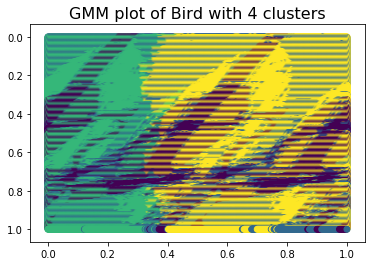

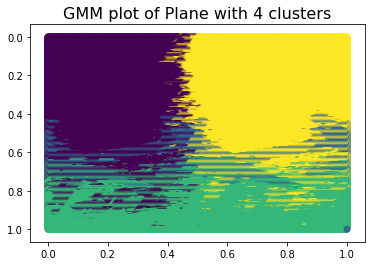

In [73]:
# implementing GMM with 4 clusters
gmmB4 = GaussianMixture(n_components=4).fit(bird_norm)
labelsB4 = gmmB4.predict(bird_norm)
df_bird['gmm-4'] = labelsB4
plt.scatter(bird_norm[:, 1], bird_norm[:, 0], c=labelsB4);
plt.gca().invert_yaxis()
plt.title('GMM plot of Bird with 4 clusters',fontsize = 16 )
plt.show()

# Plot of Plane
gmmP4 = GaussianMixture(n_components=4).fit(plane_norm)
labelsP4 = gmmP4.predict(plane_norm)
df_plane['gmm-4'] = labelsP4
plt.scatter(plane_norm[:, 1], plane_norm[:, 0], c=labelsP4);
plt.gca().invert_yaxis()
plt.title('GMM plot of Plane with 4 clusters',fontsize = 16 )
plt.show()

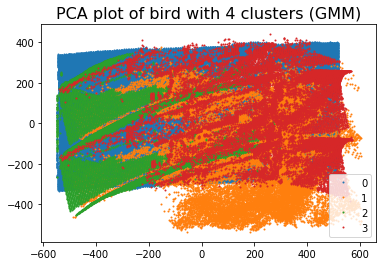

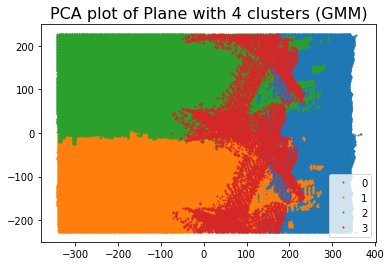

In [100]:
# Returning  to the PCA plots to display the clustering solutions above  scatter plots.
groups = df_bird.groupby('gmm-4')

fig, ax = plt.subplots()
ax.margins(0.05)
for name, group in groups:
    ax.plot(group.pca1, group.pca2, marker='o', linestyle='', ms=1, label=name)
ax.legend()

ax.set_title('PCA plot of bird with 4 clusters (GMM)',fontsize = 16)
plt.show()

# Plot of Plane
groups = df_plane.groupby('gmm-4')

fig, ax = plt.subplots()
ax.margins(0.05)
for name, group in groups:
    ax.plot(group.pca1, group.pca2, marker='o', linestyle='', ms=1, label=name)
ax.legend()

ax.set_title('PCA plot of Plane with 4 clusters (GMM)',fontsize = 16)
plt.show()

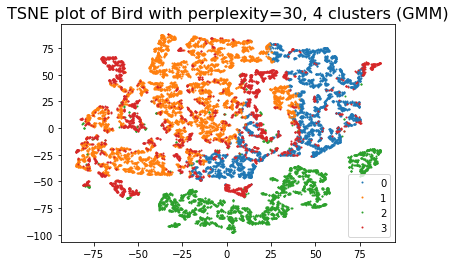

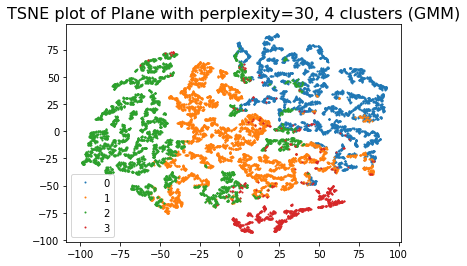

In [57]:
# Returning  to the TSNE plots to display the clustering solutions above  scatter plots.
groups = bird_sample.groupby('gmm-4')

fig, ax = plt.subplots()
ax.margins(0.05) # Optional, just adds 5% padding to the autoscaling
for name, group in groups:
    ax.plot(group.tsne1, group.tsne2, marker='o', linestyle='', ms=1, label=name)
ax.legend()
ax.set_title('TSNE plot of Bird with perplexity=30, 4 clusters (GMM)',fontsize = 16)
plt.show()

# Plot of Plane
groups = plane_sample.groupby('gmm-4')

fig, ax = plt.subplots()
ax.margins(0.05) # Optional, just adds 5% padding to the autoscaling
for name, group in groups:
    ax.plot(group.tsne1, group.tsne2, marker='o', linestyle='', ms=1, label=name)
ax.legend()
ax.set_title('TSNE plot of Plane with perplexity=30, 4 clusters (GMM)',fontsize = 16)
plt.show()

In [78]:
# Silhouette score for GMM with 4 clusters
print("Silhouette coefficient of Bird for 4 clusters:\n\n",
      metrics.silhouette_score(bird_norm, labelsB4))

print('\n')

print("Silhouette coefficient of Plane for 4 clusters:\n\n",
      metrics.silhouette_score(plane_norm, labelsP4))

Silhouette coefficient of Bird for 4 clusters:

 0.19233565534557673


Silhouette coefficient of Plane for 4 clusters:

 0.3086745010321395


In [76]:
# calculating the CH value for GMM with 4 clusters
print("CH value of Bird for 4 clusters: \n\n", 
      metrics.calinski_harabasz_score(bird_norm, labelsB4))
print('\n')
print("CH value of Plane for 4 clusters: \n\n",
      metrics.calinski_harabasz_score(plane_norm, labelsP4))

CH value of Bird for 4 clusters: 

 52220.40907274043


CH value of Plane for 4 clusters: 

 67619.19834575469


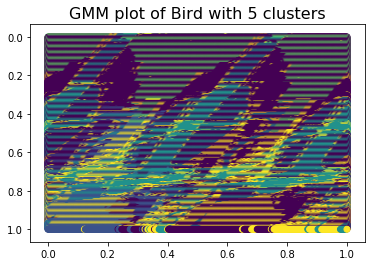

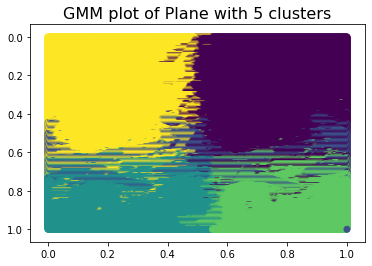

In [79]:
# implementing GMM with 5 clusters
gmmB5 = GaussianMixture(n_components=5).fit(bird_norm)
labelsB5 = gmmB5.predict(bird_norm)
df_bird['gmm-5'] = labelsB5
plt.scatter(bird_norm[:, 1], bird_norm[:, 0], c=labelsB5);
plt.gca().invert_yaxis()
plt.title('GMM plot of Bird with 5 clusters',fontsize = 16 )
plt.show()

# Plot of Plane
gmmP5 = GaussianMixture(n_components=5).fit(plane_norm)
labelsP5 = gmmP5.predict(plane_norm)
df_plane['gmm-5'] = labelsP5
plt.scatter(plane_norm[:, 1], plane_norm[:, 0], c=labelsP5);
plt.gca().invert_yaxis()
plt.title('GMM plot of Plane with 5 clusters',fontsize = 16 )
plt.show()

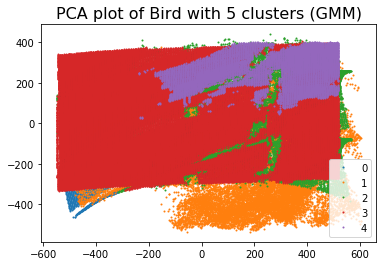

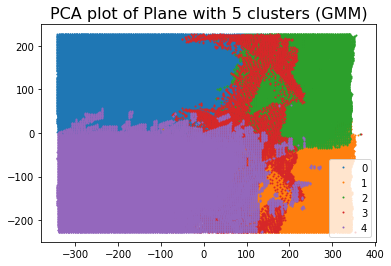

In [104]:
# Returning  to the PCA plots to display the clustering solutions above  scatter plots.
groups = df_bird.groupby('gmm-5')

fig, ax = plt.subplots()
ax.margins(0.05)
for name, group in groups:
    ax.plot(group.pca1, group.pca2, marker='o', linestyle='', ms=1, label=name)
ax.legend()
ax.set_title('PCA plot of Bird with 5 clusters (GMM)',fontsize = 16)
plt.show()


# Plots of Plane
groups = df_plane.groupby('gmm-5')

fig, ax = plt.subplots()
ax.margins(0.05)
for name, group in groups:
    ax.plot(group.pca1, group.pca2, marker='o', linestyle='', ms=1, label=name)
ax.legend()
ax.set_title('PCA plot of Plane with 5 clusters (GMM)',fontsize = 16)
plt.show()

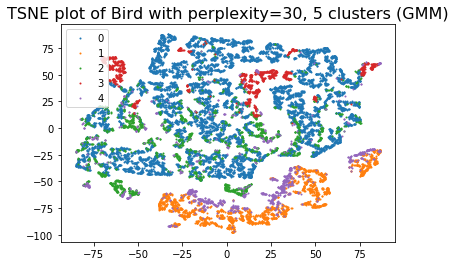

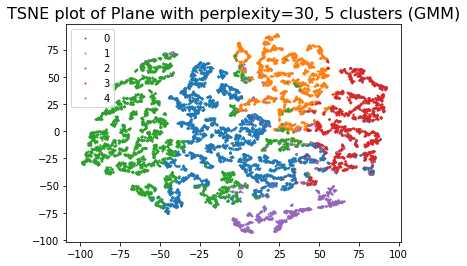

In [58]:
# Returning  to the TSNE plots to display the clustering solutions above  scatter plots.
groups = bird_sample.groupby('gmm-5')

fig, ax = plt.subplots()
ax.margins(0.05) # Optional, just adds 5% padding to the autoscaling
for name, group in groups:
    ax.plot(group.tsne1, group.tsne2, marker='o', linestyle='', ms=1, label=name)
ax.legend()
ax.set_title('TSNE plot of Bird with perplexity=30, 5 clusters (GMM)',fontsize = 16)
plt.show()

# t-sne plot of Plane
groups = plane_sample.groupby('gmm-5')

fig, ax = plt.subplots()
ax.margins(0.05) # Optional, just adds 5% padding to the autoscaling
for name, group in groups:
    ax.plot(group.tsne1, group.tsne2, marker='o', linestyle='', ms=1, label=name)
ax.legend()
ax.set_title('TSNE plot of Plane with perplexity=30, 5 clusters (GMM)',fontsize = 16)
plt.show()

In [80]:
# Silhouette score by euclidean distance for 5 clusters
print("Silhouette coefficient of Bird for 5 clusters:\n\n",
      metrics.silhouette_score(bird_norm, labelsB5))

print('\n')

print("Silhouette coefficient of Plane for 5 clusters:\n\n",
      metrics.silhouette_score(plane_norm, labelsP5))

Silhouette coefficient of Bird for 5 clusters:

 0.050357970424667116


Silhouette coefficient of Plane for 5 clusters:

 0.3294648822550882


In [81]:
# calculating the CH value for GMM with 5 clusters
print("CH value of Bird for 5 clusters: \n\n", 
      metrics.calinski_harabasz_score(bird_norm, labelsB5))
print('\n')
print("CH value of Plane for 5 clusters: \n\n",
      metrics.calinski_harabasz_score(plane_norm, labelsP5))

CH value of Bird for 5 clusters: 

 37993.514155927485


CH value of Plane for 5 clusters: 

 79682.32784262333


By comparing the Silhouette Coefficients for various clusters, we can deduce that, for GMM, the best number of clusters
for bird is 2 and the best number of clusters for plane is 2.

5) Hierarchical Clustering Solution

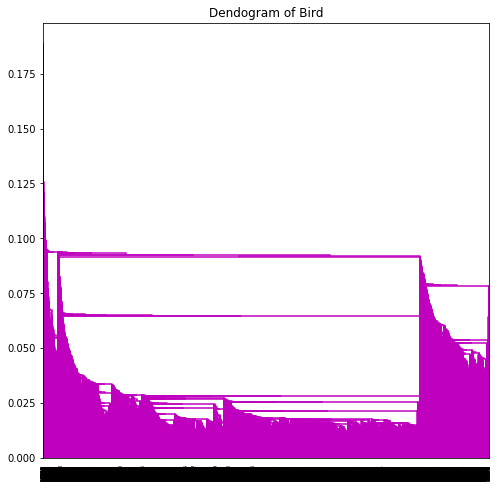

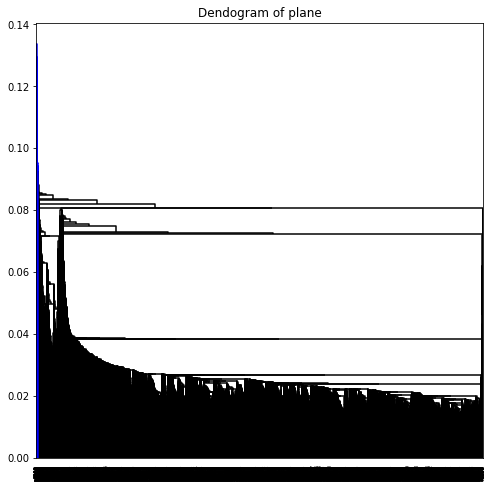

In [97]:
# Let us first plot dendrograms for bird and plane.

plt.figure(figsize=(8, 8))
plt.title("Dendogram of Bird")
dend = shc.dendrogram(shc.linkage(bird_normS, method='single'))    #Plot bird dendrogram
plt.show()

plt.figure(figsize=(8, 8))
plt.title("Dendogram of plane")
dend = shc.dendrogram(shc.linkage(plane_normS, method='single'))    #Plot plane dendrogram
plt.show()

As we can see from the above dendrograms, single linkage is grouping all data points into a single cluster and hence, is 
failing to create distinct clusters. So, I shall also use ward linkages in my solution.

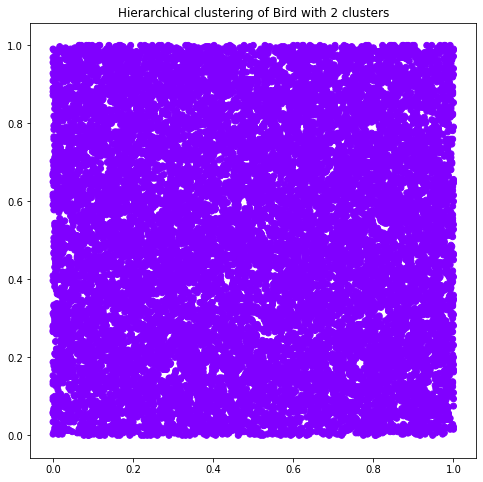

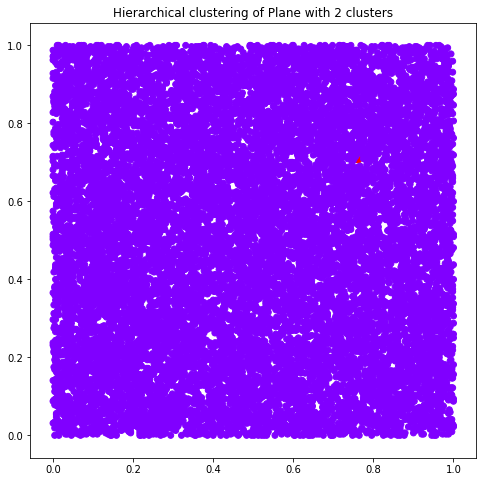

In [109]:
#Hierarchical clustering of Bird and Plane with 2 clusters with Single linkage
birdH = AgglomerativeClustering(n_clusters=2, affinity='euclidean', linkage='single')
hc_2B=birdH.fit_predict(bird_normS)
bird_sample['hc_2B']= hc_2B

plt.figure(figsize=(8, 8))
plt.scatter(bird_normS[:,0], bird_normS[:,1], c=hc_2B, cmap='rainbow')
plt.title("Hierarchical clustering of Bird with 2 clusters")
plt.show()

#Plot of plane
planeH = AgglomerativeClustering(n_clusters=2, affinity='euclidean', linkage='single')
hc_2P=planeH.fit_predict(plane_normS)
plane_sample['hc_2P']= hc_2P

plt.figure(figsize=(8, 8))
plt.scatter(plane_normS[:,0], plane_normS[:,1], c=hc_2P, cmap='rainbow')
plt.title("Hierarchical clustering of Plane with 2 clusters")
plt.show()

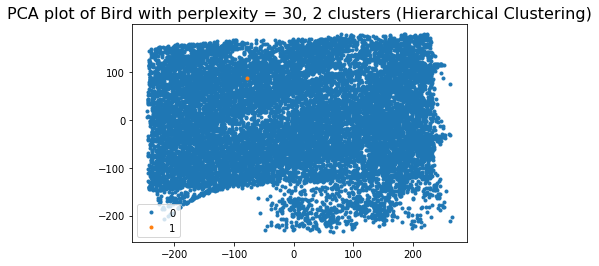

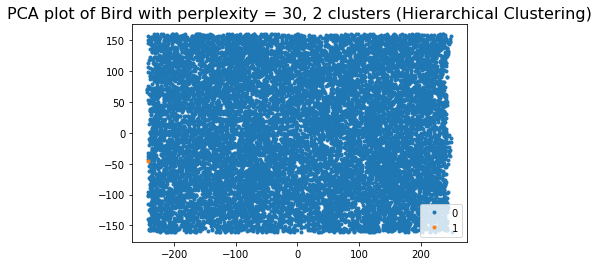

In [110]:
# Returning  to the PCA plots to display the clustering solutions above  scatter plots.

groups = bird_sample.groupby('hc_2B')

fig, ax = plt.subplots()
ax.margins(0.05)
for name, group in groups:
    ax.plot(group.pca1, group.pca2, marker='o', linestyle='', ms=3, label=name)
ax.legend()
ax.set_title('PCA plot of Bird with perplexity = 30, 2 clusters (Hierarchical Clustering)',fontsize = 16)
plt.show()

#Plot of Plane
groups = plane_sample.groupby('hc_2P')

fig, ax = plt.subplots()
ax.margins(0.05)
for name, group in groups:
    ax.plot(group.pca1, group.pca2, marker='o', linestyle='', ms=3, label=name)
ax.legend()
ax.set_title('PCA plot of Bird with perplexity = 30, 2 clusters (Hierarchical Clustering)',fontsize = 16)
plt.show()

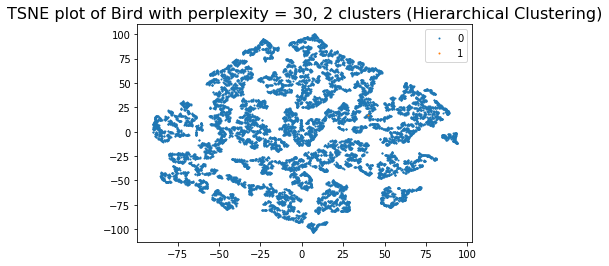

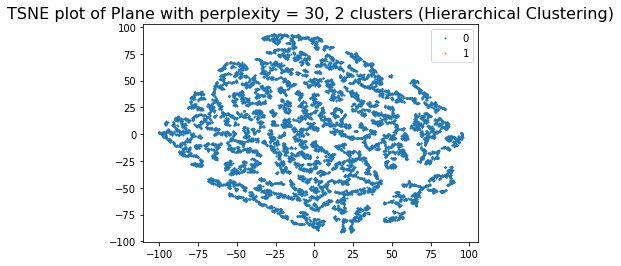

In [111]:
# Returning  to the TSNE plots to display the clustering solutions above  scatter plots.
groups = bird_sample.groupby('hc_2B')

fig, ax = plt.subplots()
ax.margins(0.05) # Optional, just adds 5% padding to the autoscaling
for name, group in groups:
    ax.plot(group.tsne1, group.tsne2, marker='o', linestyle='', ms=1, label=name)
ax.legend()
ax.set_title('TSNE plot of Bird with perplexity = 30, 2 clusters (Hierarchical Clustering)',fontsize = 16)
plt.show()

#Plot of Plane
groups = plane_sample.groupby('hc_2P')

fig, ax = plt.subplots()
ax.margins(0.05) # Optional, just adds 5% padding to the autoscaling
for name, group in groups:
    ax.plot(group.tsne1, group.tsne2, marker='o', linestyle='', ms=1, label=name)
ax.legend()
ax.set_title('TSNE plot of Plane with perplexity = 30, 2 clusters (Hierarchical Clustering)',fontsize = 16)
plt.show()

In [112]:
# Silhouette score by euclidean distance for 2 clusters
print("Silhouette coefficient of Bird for 2 clusters:\n\n",
      metrics.silhouette_score(bird_normS, hc_2B, metric='euclidean'))

print('\n')

print("Silhouette coefficient of Plane for 2 clusters:\n\n",
      metrics.silhouette_score(plane_normS, hc_2B, metric='euclidean'))

Silhouette coefficient of Bird for 2 clusters:

 -0.17661444026186943


Silhouette coefficient of Plane for 2 clusters:

 -0.1431760638323268


In [113]:
# calculating the CH value for 2 clusters
print("CH value of Bird for 2 clusters: \n\n", 
      metrics.calinski_harabasz_score(bird_normS, hc_2B))

print("CH value of Plane for 2 clusters: \n\n",
      metrics.calinski_harabasz_score(plane_normS, hc_2P))

CH value of Bird for 2 clusters: 

 0.27089965271447075
CH value of Plane for 2 clusters: 

 1.3982954816876698


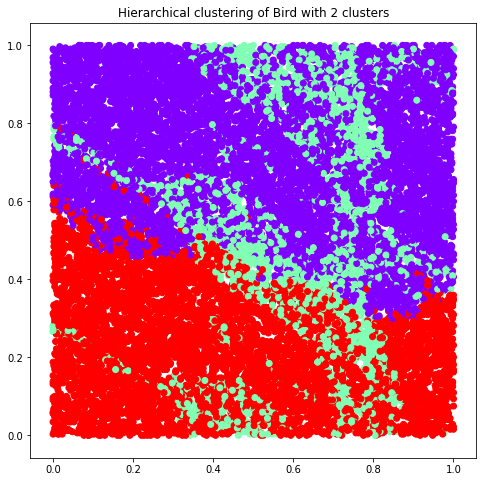

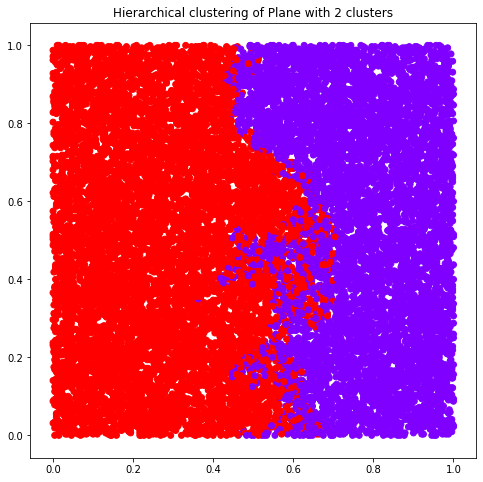

In [139]:
#Hierarchical clustering of Bird and Plane with 2 clusters with Ward linkage
birdHW = AgglomerativeClustering(n_clusters=2, affinity='euclidean', linkage='ward')
hc_2BW=birdH.fit_predict(bird_normS)
bird_sample['hc_2BW']= hc_2BW

plt.figure(figsize=(8, 8))
plt.scatter(bird_normS[:,0], bird_normS[:,1], c=hc_2BW, cmap='rainbow')
plt.title("Hierarchical clustering of Bird with 2 clusters")
plt.show()

#Plot of plane
planeH = AgglomerativeClustering(n_clusters=2, affinity='euclidean', linkage='ward')
hc_2PW=planeH.fit_predict(plane_normS)
plane_sample['hc_2PW']= hc_2PW

plt.figure(figsize=(8, 8))
plt.scatter(plane_normS[:,0], plane_normS[:,1], c=hc_2PW, cmap='rainbow')
plt.title("Hierarchical clustering of Plane with 2 clusters")
plt.show()

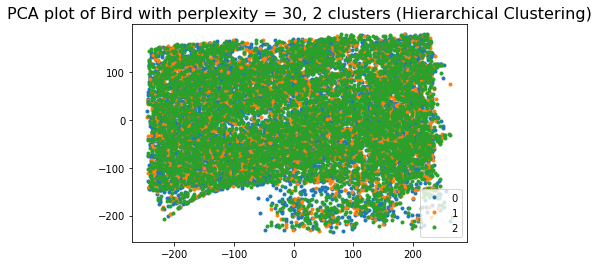

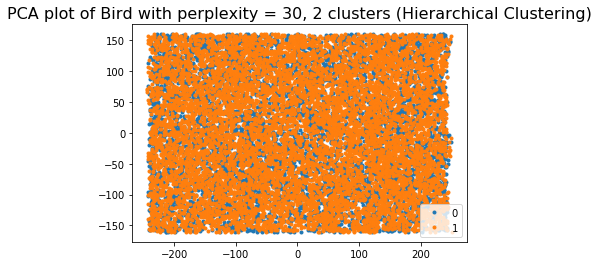

In [140]:
# Returning  to the PCA plots to display the clustering solutions above  scatter plots with ward linkage

groups = bird_sample.groupby('hc_2BW')

fig, ax = plt.subplots()
ax.margins(0.05)
for name, group in groups:
    ax.plot(group.pca1, group.pca2, marker='o', linestyle='', ms=3, label=name)
ax.legend()
ax.set_title('PCA plot of Bird with perplexity = 30, 2 clusters (Hierarchical Clustering)',fontsize = 16)
plt.show()

#Plot of Plane
groups = plane_sample.groupby('hc_2PW')

fig, ax = plt.subplots()
ax.margins(0.05)
for name, group in groups:
    ax.plot(group.pca1, group.pca2, marker='o', linestyle='', ms=3, label=name)
ax.legend()
ax.set_title('PCA plot of Bird with perplexity = 30, 2 clusters (Hierarchical Clustering)',fontsize = 16)
plt.show()

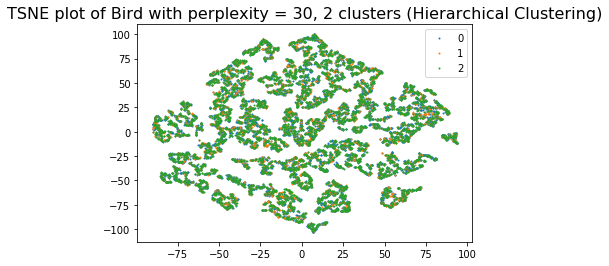

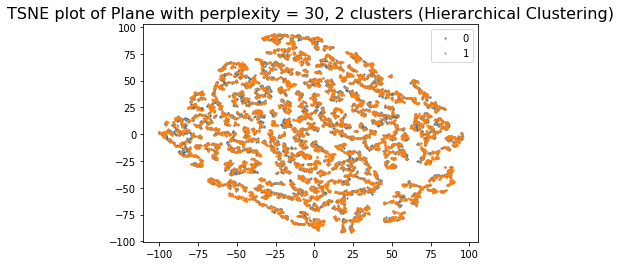

In [141]:
# Returning  to the TSNE plots to display the clustering solutions above  scatter plots.
groups = bird_sample.groupby('hc_2BW')

fig, ax = plt.subplots()
ax.margins(0.05) # Optional, just adds 5% padding to the autoscaling
for name, group in groups:
    ax.plot(group.tsne1, group.tsne2, marker='o', linestyle='', ms=1, label=name)
ax.legend()
ax.set_title('TSNE plot of Bird with perplexity = 30, 2 clusters (Hierarchical Clustering)',fontsize = 16)
plt.show()

#Plot of Plane
groups = plane_sample.groupby('hc_2PW')

fig, ax = plt.subplots()
ax.margins(0.05) # Optional, just adds 5% padding to the autoscaling
for name, group in groups:
    ax.plot(group.tsne1, group.tsne2, marker='o', linestyle='', ms=1, label=name)
ax.legend()
ax.set_title('TSNE plot of Plane with perplexity = 30, 2 clusters (Hierarchical Clustering)',fontsize = 16)
plt.show()

In [148]:
# Silhouette score by euclidean distance for 2 clusters
print("Silhouette coefficient of Bird for 2 clusters:\n\n",
      metrics.silhouette_score(bird_normS, hc_2BW, metric='euclidean'))

print('\n')

print("Silhouette coefficient of Plane for 2 clusters:\n\n",
      metrics.silhouette_score(plane_normS, hc_2PW, metric='euclidean'))

Silhouette coefficient of Bird for 2 clusters:

 0.329838134265806


Silhouette coefficient of Plane for 2 clusters:

 0.3241091488179799


In [143]:
# calculating the CH value for 2 clusters
print("CH value of Bird for 2 clusters: \n\n", 
      metrics.calinski_harabasz_score(bird_normS, hc_2BW))

print("CH value of Plane for 2 clusters: \n\n",
      metrics.calinski_harabasz_score(plane_normS, hc_2PW))

CH value of Bird for 2 clusters: 

 9361.786976494883
CH value of Plane for 2 clusters: 

 7422.837542118017


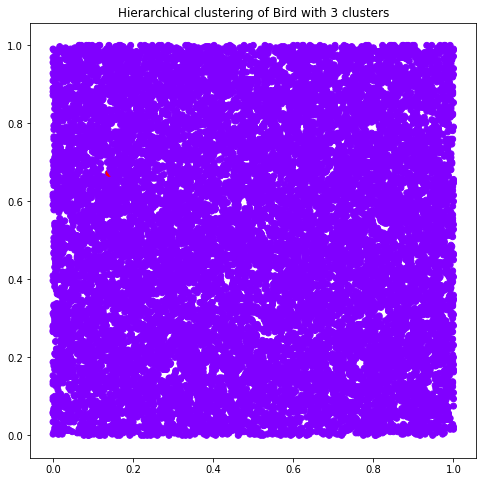

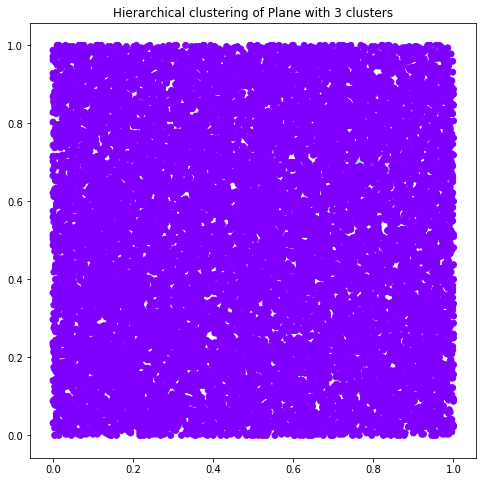

In [122]:
#Hierarchical clustering of Bird and Plane with 3 clusters with Single linkage
birdH = AgglomerativeClustering(n_clusters=3, affinity='euclidean', linkage='single')
hc_3B=birdH.fit_predict(bird_normS)
bird_sample['hc_3B']= hc_3B

plt.figure(figsize=(8, 8))
plt.scatter(bird_normS[:,0], bird_normS[:,1], c=hc_3B, cmap='rainbow')
plt.title("Hierarchical clustering of Bird with 3 clusters")
plt.show()

#Plot of plane
planeH = AgglomerativeClustering(n_clusters=3, affinity='euclidean', linkage='single')
hc_3P=planeH.fit_predict(plane_normS)
plane_sample['hc_3P']= hc_3P

plt.figure(figsize=(8, 8))
plt.scatter(plane_normS[:,0], plane_normS[:,1], c=hc_3P, cmap='rainbow')
plt.title("Hierarchical clustering of Plane with 3 clusters")
plt.show()

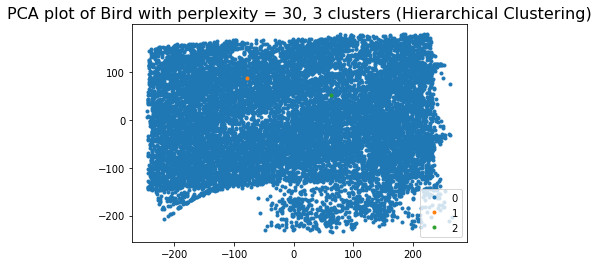

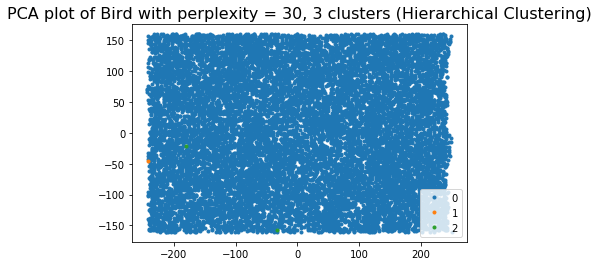

In [123]:
# Returning  to the PCA plots to display the clustering solutions above  scatter plots.

groups = bird_sample.groupby('hc_3B')

fig, ax = plt.subplots()
ax.margins(0.05)
for name, group in groups:
    ax.plot(group.pca1, group.pca2, marker='o', linestyle='', ms=3, label=name)
ax.legend()
ax.set_title('PCA plot of Bird with perplexity = 30, 3 clusters (Hierarchical Clustering)',fontsize = 16)
plt.show()

#Plot of Plane
groups = plane_sample.groupby('hc_3P')

fig, ax = plt.subplots()
ax.margins(0.05)
for name, group in groups:
    ax.plot(group.pca1, group.pca2, marker='o', linestyle='', ms=3, label=name)
ax.legend()
ax.set_title('PCA plot of Bird with perplexity = 30, 3 clusters (Hierarchical Clustering)',fontsize = 16)
plt.show()

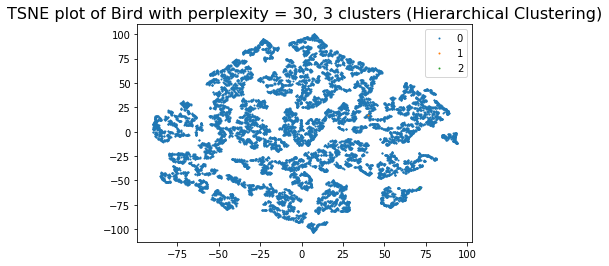

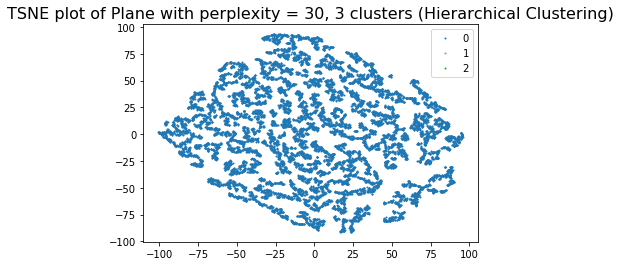

In [124]:
# Returning  to the TSNE plots to display the clustering solutions above  scatter plots.
groups = bird_sample.groupby('hc_3B')

fig, ax = plt.subplots()
ax.margins(0.05) # Optional, just adds 5% padding to the autoscaling
for name, group in groups:
    ax.plot(group.tsne1, group.tsne2, marker='o', linestyle='', ms=1, label=name)
ax.legend()
ax.set_title('TSNE plot of Bird with perplexity = 30, 3 clusters (Hierarchical Clustering)',fontsize = 16)
plt.show()

#Plot of Plane
groups = plane_sample.groupby('hc_3P')

fig, ax = plt.subplots()
ax.margins(0.05) # Optional, just adds 5% padding to the autoscaling
for name, group in groups:
    ax.plot(group.tsne1, group.tsne2, marker='o', linestyle='', ms=1, label=name)
ax.legend()
ax.set_title('TSNE plot of Plane with perplexity = 30, 3 clusters (Hierarchical Clustering)',fontsize = 16)
plt.show()

In [125]:
# Silhouette score by euclidean distance for 3 clusters
print("Silhouette coefficient of Bird for 3 clusters:\n\n",
      metrics.silhouette_score(bird_normS, hc_3B, metric='euclidean'))

print('\n')

print("Silhouette coefficient of Plane for 3 clusters:\n\n",
      metrics.silhouette_score(plane_normS, hc_3B, metric='euclidean'))

Silhouette coefficient of Bird for 3 clusters:

 -0.24039505360489405


Silhouette coefficient of Plane for 3 clusters:

 -0.3095477842950059


In [126]:
# calculating the CH value for 3 clusters
print("CH value of Bird for 3 clusters: \n\n", 
      metrics.calinski_harabasz_score(bird_normS, hc_3B))
print('\n')
print("CH value of Plane for 3 clusters: \n\n",
      metrics.calinski_harabasz_score(plane_normS, hc_3P))

CH value of Bird for 3 clusters: 

 0.45017000258056744


CH value of Plane for 3 clusters: 

 1.8706975879650245


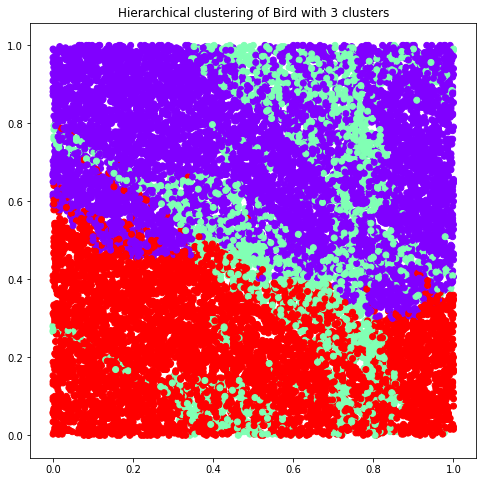

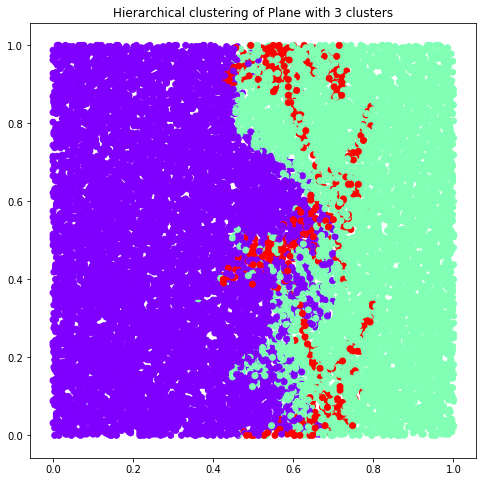

In [144]:
#Hierarchical clustering of Bird and Plane with 3 clusters with ward linkage
birdH = AgglomerativeClustering(n_clusters=3, affinity='euclidean', linkage='ward')
hc_3BW=birdH.fit_predict(bird_normS)
bird_sample['hc_3BW']= hc_3BW

plt.figure(figsize=(8, 8))
plt.scatter(bird_normS[:,0], bird_normS[:,1], c=hc_3BW, cmap='rainbow')
plt.title("Hierarchical clustering of Bird with 3 clusters")
plt.show()

#Plot of plane
planeH = AgglomerativeClustering(n_clusters=3, affinity='euclidean', linkage='ward')
hc_3PW=planeH.fit_predict(plane_normS)
plane_sample['hc_3PW']= hc_3PW

plt.figure(figsize=(8, 8))
plt.scatter(plane_normS[:,0], plane_normS[:,1], c=hc_3PW, cmap='rainbow')
plt.title("Hierarchical clustering of Plane with 3 clusters")
plt.show()

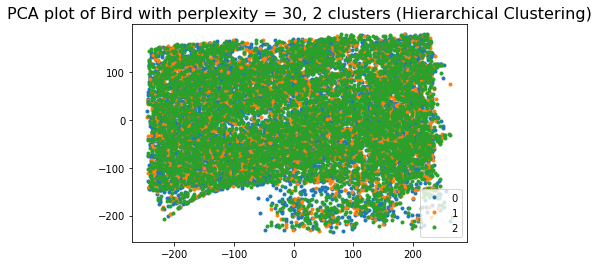

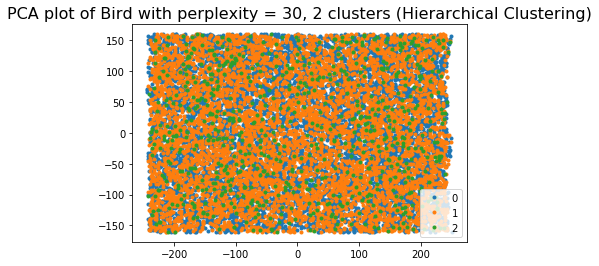

In [145]:
# Returning  to the PCA plots to display the clustering solutions above  scatter plots with ward linkage

groups = bird_sample.groupby('hc_3BW')

fig, ax = plt.subplots()
ax.margins(0.05)
for name, group in groups:
    ax.plot(group.pca1, group.pca2, marker='o', linestyle='', ms=3, label=name)
ax.legend()
ax.set_title('PCA plot of Bird with perplexity = 30, 2 clusters (Hierarchical Clustering)',fontsize = 16)
plt.show()

#Plot of Plane
groups = plane_sample.groupby('hc_3PW')

fig, ax = plt.subplots()
ax.margins(0.05)
for name, group in groups:
    ax.plot(group.pca1, group.pca2, marker='o', linestyle='', ms=3, label=name)
ax.legend()
ax.set_title('PCA plot of Bird with perplexity = 30, 2 clusters (Hierarchical Clustering)',fontsize = 16)
plt.show()

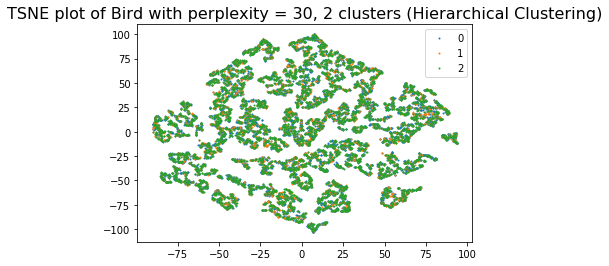

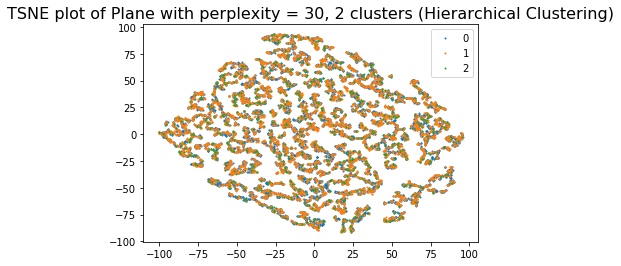

In [146]:
# Returning  to the TSNE plots to display the clustering solutions above  scatter plots.
groups = bird_sample.groupby('hc_3BW')

fig, ax = plt.subplots()
ax.margins(0.05) # Optional, just adds 5% padding to the autoscaling
for name, group in groups:
    ax.plot(group.tsne1, group.tsne2, marker='o', linestyle='', ms=1, label=name)
ax.legend()
ax.set_title('TSNE plot of Bird with perplexity = 30, 2 clusters (Hierarchical Clustering)',fontsize = 16)
plt.show()

#Plot of Plane
groups = plane_sample.groupby('hc_3PW')

fig, ax = plt.subplots()
ax.margins(0.05) # Optional, just adds 5% padding to the autoscaling
for name, group in groups:
    ax.plot(group.tsne1, group.tsne2, marker='o', linestyle='', ms=1, label=name)
ax.legend()
ax.set_title('TSNE plot of Plane with perplexity = 30, 2 clusters (Hierarchical Clustering)',fontsize = 16)
plt.show()

In [147]:
# Silhouette score by euclidean distance for 3 clusters
print("Silhouette coefficient of Bird for 3 clusters:\n\n",
      metrics.silhouette_score(bird_normS, hc_3BW, metric='euclidean'))

print('\n')

print("Silhouette coefficient of Plane for 3 clusters:\n\n",
      metrics.silhouette_score(plane_normS, hc_3PW, metric='euclidean'))

Silhouette coefficient of Bird for 3 clusters:

 0.329838134265806


Silhouette coefficient of Plane for 3 clusters:

 0.3394512417008721


In [152]:
# calculating the CH value for 3 clusters
print("CH value of Bird for 3 clusters: \n\n", 
      metrics.calinski_harabasz_score(bird_normS, hc_3BW))

print("CH value of Plane for 3 clusters: \n\n",
      metrics.calinski_harabasz_score(plane_normS, hc_3PW))

CH value of Bird for 3 clusters: 

 9361.786976494883
CH value of Plane for 3 clusters: 

 6680.695773981106


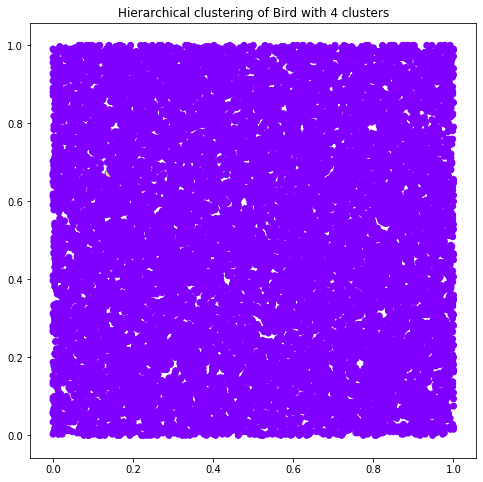

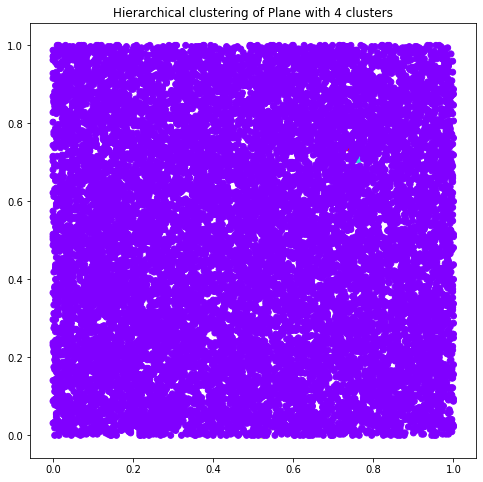

In [127]:
#Hierarchical clustering of Bird and Plane with 4 clusters
birdH = AgglomerativeClustering(n_clusters=4, affinity='euclidean', linkage='single')
hc_4B=birdH.fit_predict(bird_normS)
bird_sample['hc_4B']= hc_4B

plt.figure(figsize=(8, 8))
plt.scatter(bird_normS[:,0], bird_normS[:,1], c=hc_4B, cmap='rainbow')
plt.title("Hierarchical clustering of Bird with 4 clusters")
plt.show()

#Plot of plane
planeH = AgglomerativeClustering(n_clusters=4, affinity='euclidean', linkage='single')
hc_4P=planeH.fit_predict(plane_normS)
plane_sample['hc_4P']= hc_4P

plt.figure(figsize=(8, 8))
plt.scatter(plane_normS[:,0], plane_normS[:,1], c=hc_4P, cmap='rainbow')
plt.title("Hierarchical clustering of Plane with 4 clusters")
plt.show()

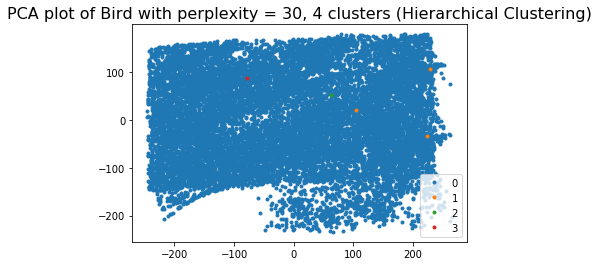

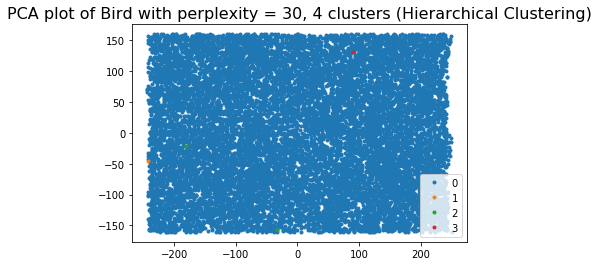

In [151]:
# Returning  to the PCA plots to display the clustering solutions above  scatter plots.

groups = bird_sample.groupby('hc_4B')

fig, ax = plt.subplots()
ax.margins(0.05)
for name, group in groups:
    ax.plot(group.pca1, group.pca2, marker='o', linestyle='', ms=3, label=name)
ax.legend()
ax.set_title('PCA plot of Bird with perplexity = 30, 4 clusters (Hierarchical Clustering)',fontsize = 16)
plt.show()

#Plot of Plane
groups = plane_sample.groupby('hc_4P')

fig, ax = plt.subplots()
ax.margins(0.05)
for name, group in groups:
    ax.plot(group.pca1, group.pca2, marker='o', linestyle='', ms=3, label=name)
ax.legend()
ax.set_title('PCA plot of Bird with perplexity = 30, 4 clusters (Hierarchical Clustering)',fontsize = 16)
plt.show()

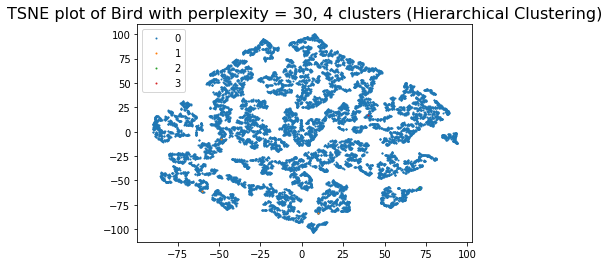

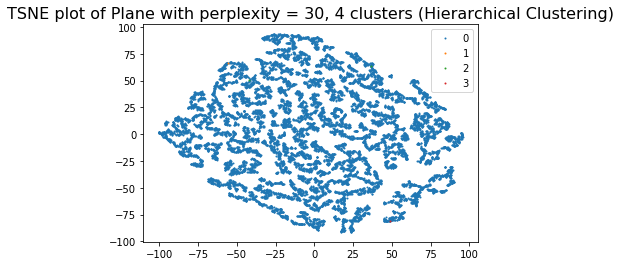

In [129]:
# Returning  to the TSNE plots to display the clustering solutions above  scatter plots.
groups = bird_sample.groupby('hc_4B')

fig, ax = plt.subplots()
ax.margins(0.05) # Optional, just adds 5% padding to the autoscaling
for name, group in groups:
    ax.plot(group.tsne1, group.tsne2, marker='o', linestyle='', ms=1, label=name)
ax.legend()
ax.set_title('TSNE plot of Bird with perplexity = 30, 4 clusters (Hierarchical Clustering)',fontsize = 16)
plt.show()

#Plot of Plane
groups = plane_sample.groupby('hc_4P')

fig, ax = plt.subplots()
ax.margins(0.05) # Optional, just adds 5% padding to the autoscaling
for name, group in groups:
    ax.plot(group.tsne1, group.tsne2, marker='o', linestyle='', ms=1, label=name)
ax.legend()
ax.set_title('TSNE plot of Plane with perplexity = 30, 4 clusters (Hierarchical Clustering)',fontsize = 16)
plt.show()

In [157]:
# Silhouette score by euclidean distance for 4 clusters
print("Silhouette coefficient of Bird for 4 clusters:\n\n",
      metrics.silhouette_score(bird_normS, hc_4B, metric='euclidean'))

print('\n')

print("Silhouette coefficient of Plane for 4 clusters:\n\n",
      metrics.silhouette_score(plane_normS, hc_4P, metric='euclidean'))

Silhouette coefficient of Bird for 4 clusters:

 -0.2827166915203244


Silhouette coefficient of Plane for 4 clusters:

 -0.10176377508508319


In [131]:
# calculating the CH value for 4 clusters
print("CH value of Bird for 4 clusters: \n\n", 
      metrics.calinski_harabasz_score(bird_normS, hc_4B))
print('\n')
print("CH value of Plane for 4 clusters: \n\n",
      metrics.calinski_harabasz_score(plane_normS, hc_4P))

CH value of Bird for 4 clusters: 

 0.4888956297973016


CH value of Plane for 4 clusters: 

 1.9194016126443052


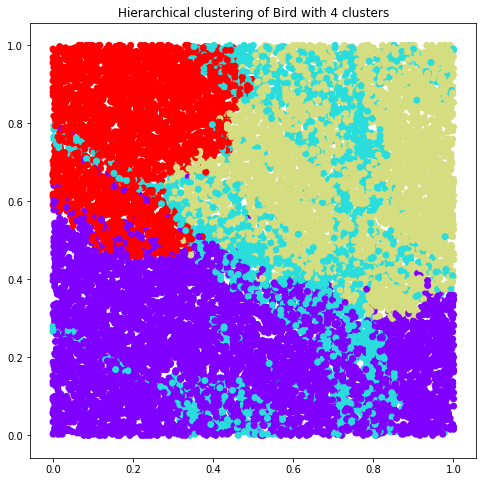

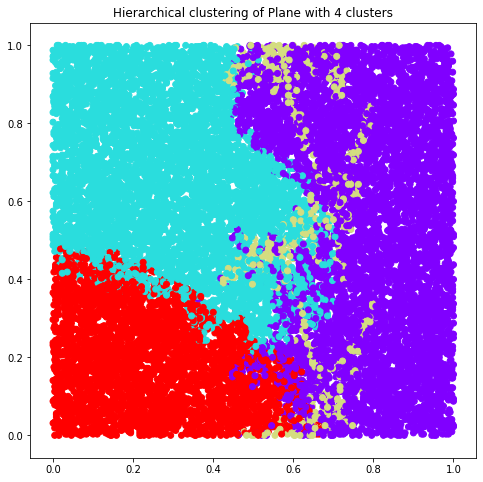

In [153]:
#Hierarchical clustering of Bird and Plane with 4 clusters with Ward linkage
birdH = AgglomerativeClustering(n_clusters=4, affinity='euclidean', linkage='ward')
hc_4BW=birdH.fit_predict(bird_normS)
bird_sample['hc_4BW']= hc_4BW

plt.figure(figsize=(8, 8))
plt.scatter(bird_normS[:,0], bird_normS[:,1], c=hc_4BW, cmap='rainbow')
plt.title("Hierarchical clustering of Bird with 4 clusters")
plt.show()

#Plot of plane
planeH = AgglomerativeClustering(n_clusters=4, affinity='euclidean', linkage='ward')
hc_4PW=planeH.fit_predict(plane_normS)
plane_sample['hc_4PW']= hc_4PW

plt.figure(figsize=(8, 8))
plt.scatter(plane_normS[:,0], plane_normS[:,1], c=hc_4PW, cmap='rainbow')
plt.title("Hierarchical clustering of Plane with 4 clusters")
plt.show()

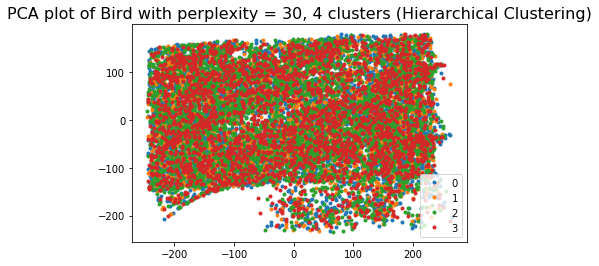

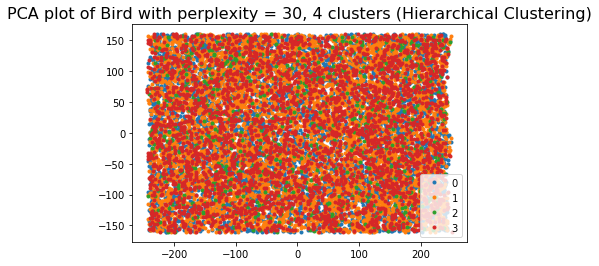

In [154]:
# Returning  to the PCA plots to display the clustering solutions above  scatter plots.

groups = bird_sample.groupby('hc_4BW')

fig, ax = plt.subplots()
ax.margins(0.05)
for name, group in groups:
    ax.plot(group.pca1, group.pca2, marker='o', linestyle='', ms=3, label=name)
ax.legend()
ax.set_title('PCA plot of Bird with perplexity = 30, 4 clusters (Hierarchical Clustering)',fontsize = 16)
plt.show()

#Plot of Plane
groups = plane_sample.groupby('hc_4PW')

fig, ax = plt.subplots()
ax.margins(0.05)
for name, group in groups:
    ax.plot(group.pca1, group.pca2, marker='o', linestyle='', ms=3, label=name)
ax.legend()
ax.set_title('PCA plot of Bird with perplexity = 30, 4 clusters (Hierarchical Clustering)',fontsize = 16)
plt.show()

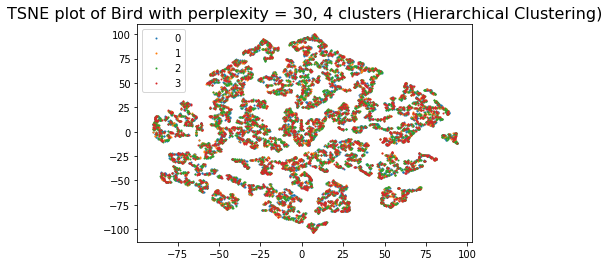

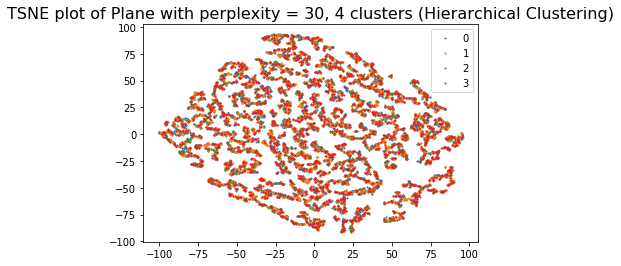

In [155]:
# Returning  to the TSNE plots to display the clustering solutions above  scatter plots.
groups = bird_sample.groupby('hc_4BW')

fig, ax = plt.subplots()
ax.margins(0.05) # Optional, just adds 5% padding to the autoscaling
for name, group in groups:
    ax.plot(group.tsne1, group.tsne2, marker='o', linestyle='', ms=1, label=name)
ax.legend()
ax.set_title('TSNE plot of Bird with perplexity = 30, 4 clusters (Hierarchical Clustering)',fontsize = 16)
plt.show()

#Plot of Plane
groups = plane_sample.groupby('hc_4PW')

fig, ax = plt.subplots()
ax.margins(0.05) # Optional, just adds 5% padding to the autoscaling
for name, group in groups:
    ax.plot(group.tsne1, group.tsne2, marker='o', linestyle='', ms=1, label=name)
ax.legend()
ax.set_title('TSNE plot of Plane with perplexity = 30, 4 clusters (Hierarchical Clustering)',fontsize = 16)
plt.show()

In [156]:
# Silhouette score by euclidean distance for 4 clusters
print("Silhouette coefficient of Bird for 4 clusters:\n\n",
      metrics.silhouette_score(bird_normS, hc_4BW, metric='euclidean'))

print('\n')

print("Silhouette coefficient of Plane for 4 clusters:\n\n",
      metrics.silhouette_score(plane_normS, hc_4PW, metric='euclidean'))

Silhouette coefficient of Bird for 4 clusters:

 0.32494893581681106


Silhouette coefficient of Plane for 4 clusters:

 0.3032712698446129


In [158]:
# calculating the CH value for 4 clusters
print("CH value of Bird for 4 clusters: \n\n", 
      metrics.calinski_harabasz_score(bird_normS, hc_4BW))
print('\n')
print("CH value of Plane for 4 clusters: \n\n",
      metrics.calinski_harabasz_score(plane_normS, hc_4PW))

CH value of Bird for 4 clusters: 

 9534.52134444443


CH value of Plane for 4 clusters: 

 7371.434156194374


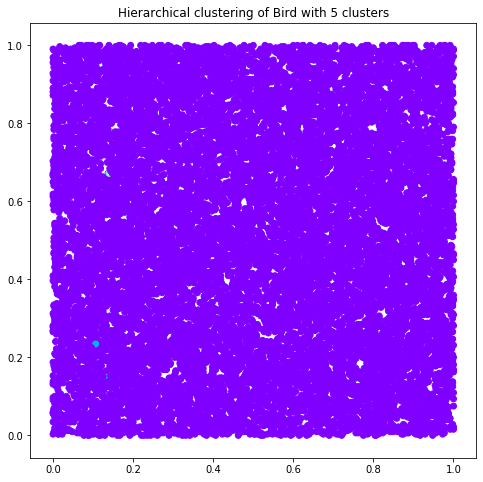

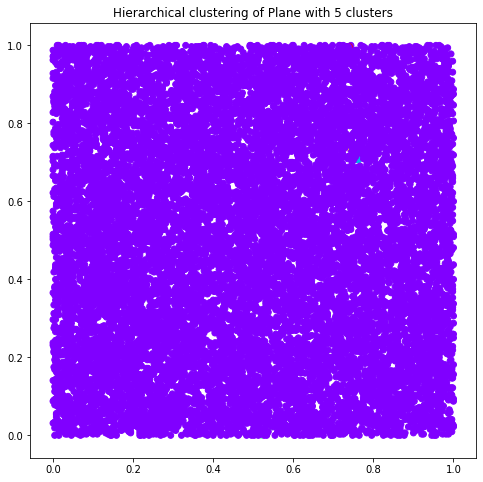

In [132]:
#Hierarchical clustering of Bird and Plane with 5 clusters
birdH = AgglomerativeClustering(n_clusters=5, affinity='euclidean', linkage='single')
hc_5B=birdH.fit_predict(bird_normS)
bird_sample['hc_5B']= hc_5B

plt.figure(figsize=(8, 8))
plt.scatter(bird_normS[:,0], bird_normS[:,1], c=hc_5B, cmap='rainbow')
plt.title("Hierarchical clustering of Bird with 5 clusters")
plt.show()

#Plot of plane
planeH = AgglomerativeClustering(n_clusters=5, affinity='euclidean', linkage='single')
hc_5P=planeH.fit_predict(plane_normS)
plane_sample['hc_5P']= hc_5P

plt.figure(figsize=(8, 8))
plt.scatter(plane_normS[:,0], plane_normS[:,1], c=hc_5P, cmap='rainbow')
plt.title("Hierarchical clustering of Plane with 5 clusters")
plt.show()

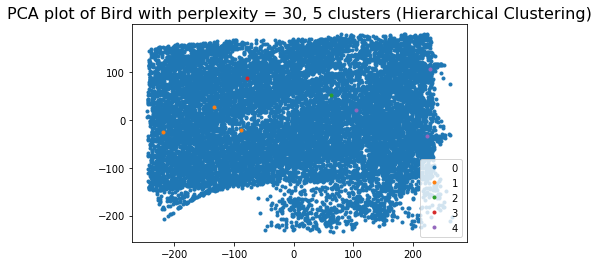

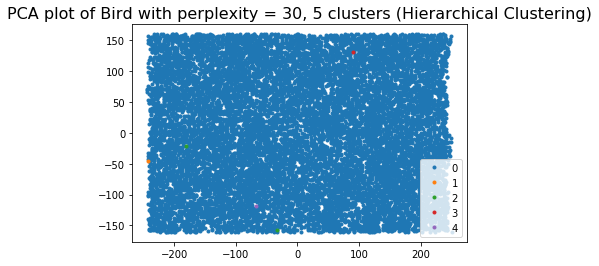

In [133]:
# Returning  to the PCA plots to display the clustering solutions above  scatter plots.

groups = bird_sample.groupby('hc_5B')

fig, ax = plt.subplots()
ax.margins(0.05)
for name, group in groups:
    ax.plot(group.pca1, group.pca2, marker='o', linestyle='', ms=3, label=name)
ax.legend()
ax.set_title('PCA plot of Bird with perplexity = 30, 5 clusters (Hierarchical Clustering)',fontsize = 16)
plt.show()

#Plot of Plane
groups = plane_sample.groupby('hc_5P')

fig, ax = plt.subplots()
ax.margins(0.05)
for name, group in groups:
    ax.plot(group.pca1, group.pca2, marker='o', linestyle='', ms=3, label=name)
ax.legend()
ax.set_title('PCA plot of Bird with perplexity = 30, 5 clusters (Hierarchical Clustering)',fontsize = 16)
plt.show()

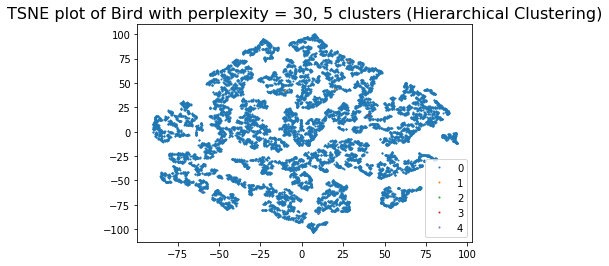

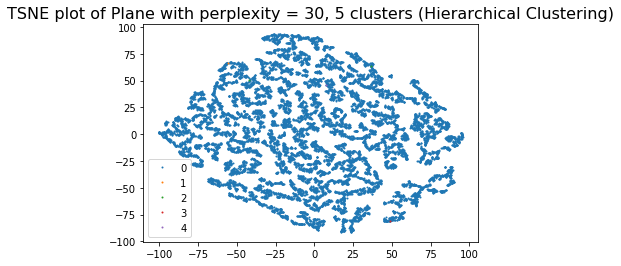

In [134]:
# Returning  to the TSNE plots to display the clustering solutions above  scatter plots.
groups = bird_sample.groupby('hc_5B')

fig, ax = plt.subplots()
ax.margins(0.05) # Optional, just adds 5% padding to the autoscaling
for name, group in groups:
    ax.plot(group.tsne1, group.tsne2, marker='o', linestyle='', ms=1, label=name)
ax.legend()
ax.set_title('TSNE plot of Bird with perplexity = 30, 5 clusters (Hierarchical Clustering)',fontsize = 16)
plt.show()

#Plot of Plane
groups = plane_sample.groupby('hc_5P')

fig, ax = plt.subplots()
ax.margins(0.05) # Optional, just adds 5% padding to the autoscaling
for name, group in groups:
    ax.plot(group.tsne1, group.tsne2, marker='o', linestyle='', ms=1, label=name)
ax.legend()
ax.set_title('TSNE plot of Plane with perplexity = 30, 5 clusters (Hierarchical Clustering)',fontsize = 16)
plt.show()

In [163]:
# Silhouette score by euclidean distance for 5 clusters
print("Silhouette coefficient of Bird for 5 clusters:\n\n",
      metrics.silhouette_score(bird_normS, hc_5B, metric='euclidean'))

print('\n')

print("Silhouette coefficient of Plane for 5 clusters:\n\n",
      metrics.silhouette_score(plane_normS, hc_5P, metric='euclidean'))

Silhouette coefficient of Bird for 5 clusters:

 -0.31767224740126826


Silhouette coefficient of Plane for 5 clusters:

 -0.14332426821619845


In [135]:
# calculating the CH value for 5 clusters
print("CH value of Bird for 5 clusters: \n\n", 
      metrics.calinski_harabasz_score(bird_normS, hc_5B))
print('\n')
print("CH value of Plane for 5 clusters: \n\n",
      metrics.calinski_harabasz_score(plane_normS, hc_5P))

CH value of Bird for 5 clusters: 

 1.0218710834346934


CH value of Plane for 5 clusters: 

 1.8878079952153548


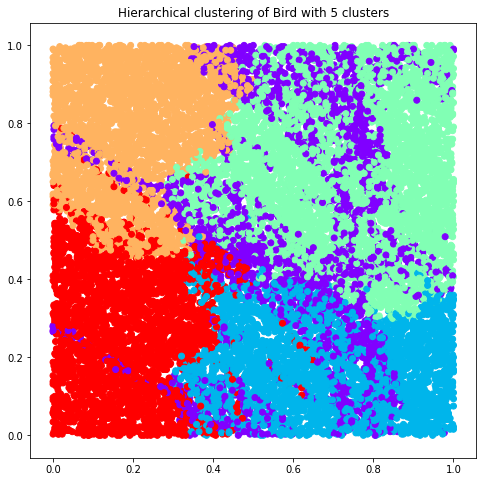

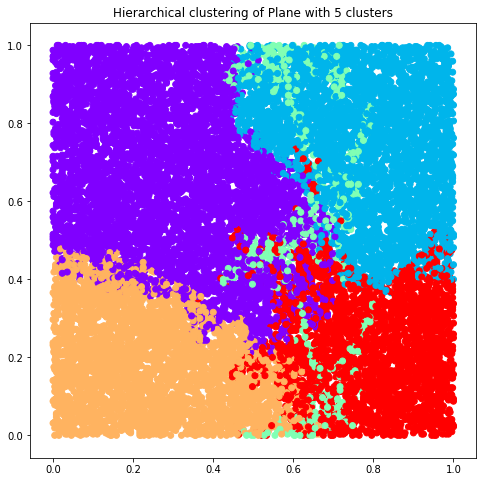

In [159]:
#Hierarchical clustering of Bird and Plane with 5 clusters
birdH = AgglomerativeClustering(n_clusters=5, affinity='euclidean', linkage='ward')
hc_5BW=birdH.fit_predict(bird_normS)
bird_sample['hc_5BW']= hc_5BW

plt.figure(figsize=(8, 8))
plt.scatter(bird_normS[:,0], bird_normS[:,1], c=hc_5BW, cmap='rainbow')
plt.title("Hierarchical clustering of Bird with 5 clusters")
plt.show()

#Plot of plane
planeH = AgglomerativeClustering(n_clusters=5, affinity='euclidean', linkage='ward')
hc_5PW=planeH.fit_predict(plane_normS)
plane_sample['hc_5PW']= hc_5PW

plt.figure(figsize=(8, 8))
plt.scatter(plane_normS[:,0], plane_normS[:,1], c=hc_5PW, cmap='rainbow')
plt.title("Hierarchical clustering of Plane with 5 clusters")
plt.show()

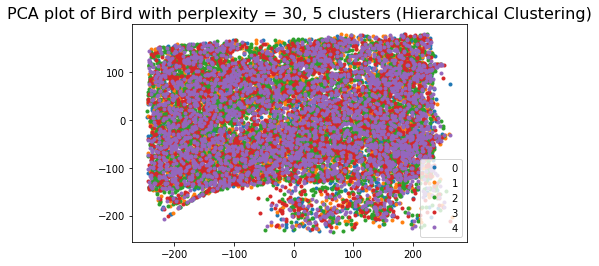

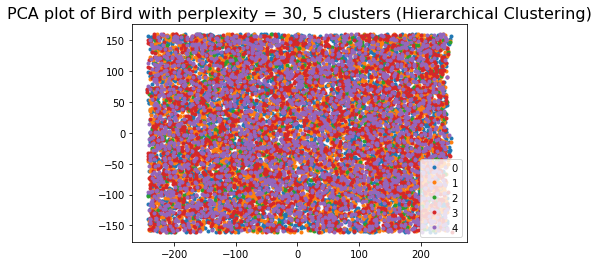

In [160]:
# Returning  to the PCA plots to display the clustering solutions above  scatter plots.

groups = bird_sample.groupby('hc_5BW')

fig, ax = plt.subplots()
ax.margins(0.05)
for name, group in groups:
    ax.plot(group.pca1, group.pca2, marker='o', linestyle='', ms=3, label=name)
ax.legend()
ax.set_title('PCA plot of Bird with perplexity = 30, 5 clusters (Hierarchical Clustering)',fontsize = 16)
plt.show()

#Plot of Plane
groups = plane_sample.groupby('hc_5PW')

fig, ax = plt.subplots()
ax.margins(0.05)
for name, group in groups:
    ax.plot(group.pca1, group.pca2, marker='o', linestyle='', ms=3, label=name)
ax.legend()
ax.set_title('PCA plot of Bird with perplexity = 30, 5 clusters (Hierarchical Clustering)',fontsize = 16)
plt.show()

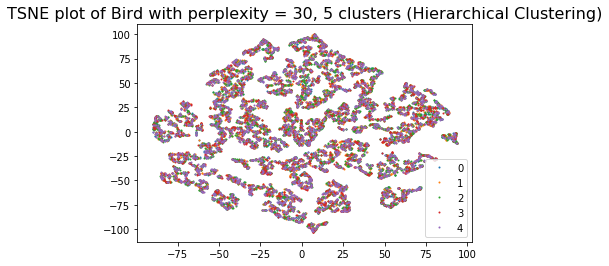

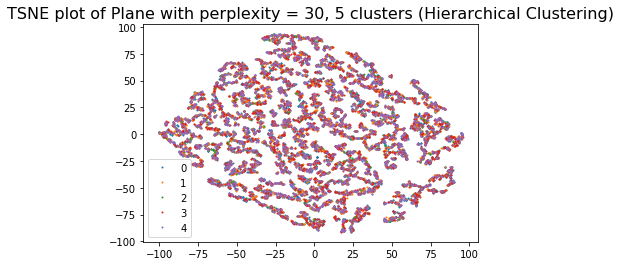

In [161]:
# Returning  to the TSNE plots to display the clustering solutions above  scatter plots.
groups = bird_sample.groupby('hc_5BW')

fig, ax = plt.subplots()
ax.margins(0.05) # Optional, just adds 5% padding to the autoscaling
for name, group in groups:
    ax.plot(group.tsne1, group.tsne2, marker='o', linestyle='', ms=1, label=name)
ax.legend()
ax.set_title('TSNE plot of Bird with perplexity = 30, 5 clusters (Hierarchical Clustering)',fontsize = 16)
plt.show()

#Plot of Plane
groups = plane_sample.groupby('hc_5PW')

fig, ax = plt.subplots()
ax.margins(0.05) # Optional, just adds 5% padding to the autoscaling
for name, group in groups:
    ax.plot(group.tsne1, group.tsne2, marker='o', linestyle='', ms=1, label=name)
ax.legend()
ax.set_title('TSNE plot of Plane with perplexity = 30, 5 clusters (Hierarchical Clustering)',fontsize = 16)
plt.show()

In [162]:
# Silhouette score by euclidean distance for 5 clusters
print("Silhouette coefficient of Bird for 5 clusters:\n\n",
      metrics.silhouette_score(bird_normS, hc_5BW, metric='euclidean'))

print('\n')

print("Silhouette coefficient of Plane for 5 clusters:\n\n",
      metrics.silhouette_score(plane_normS, hc_5PW, metric='euclidean'))

Silhouette coefficient of Bird for 5 clusters:

 0.34249206546522715


Silhouette coefficient of Plane for 5 clusters:

 0.32680902187205


In [164]:
# calculating the CH value for 5 clusters
print("CH value of Bird for 5 clusters: \n\n", 
      metrics.calinski_harabasz_score(bird_normS, hc_5BW))
print('\n')
print("CH value of Plane for 5 clusters: \n\n",
      metrics.calinski_harabasz_score(plane_normS, hc_5PW))

CH value of Bird for 5 clusters: 

 10262.310871619102


CH value of Plane for 5 clusters: 

 9021.762657099309


We are getting negative Silhouette Coefficients for all the clusters, using 'Single' linkage. The results improve drastically and become more accurate with 'Ward linkage'. Among all the clusters, both bird and plane give lowest negative values of Silhouette Coefficient with 2 clusters. So, we can as well go with 2 clusters.

The ward linkage gives highest Silhouette coefficient for cluster number 5 for Bird and cluster number 3 for Plane.